In [1]:
import os
import gc
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import torchvision
import numpy as np
import torch.nn.functional as F

import torch.nn as nn
import numpy as np
import re
from collections import defaultdict
import matplotlib.pyplot as plt

import pandas as pd

from data_set_image_net import get_dataset_image_net

from models_repo import load_checkpoint, load_model

from data_sets import get_dataset , get_dataset_test
from helper_functions import show_random_images, get_random_images_from_loader
from test_functions import model_evaluater, plot_output_variances, plot_variances

from torch.optim import Adam, SGD

c:\Users\Steffen\.conda\envs\pytorch_1\Lib\site-packages\deeplake\util\check_latest_version.py:32: UserWarning: A newer version of deeplake (4.1.1) is available. It's recommended that you update to the latest version using `pip install -U deeplake`.
  warnings.warn(


In [2]:
#Importing models
from models_repo import last_layer_BBBN_MNIST, last_layer_BBBN_CIFAR_10, last_layer_BBBN_STL_10, last_layer_BBBN_ImageNet
from models_repo import FULL_BBBN_MNIST, FULL_BBBN_CIFAR_10, FULL_BBBN_STL_10 , FULL_BBBN_ImageNet
from models_repo import Dropout_LL_CNN_MNIST, Dropout_LL_CNN_CIFAR_10, Dropout_LL_CNN_STL_10, Dropout_LL_CNN_ImageNet
from models_repo import Dropout_CNN_MNIST, Dropout_CNN_CIFAR_10, Dropout_CNN_STL_10 , Dropout_CNN_ImageNet
from models_repo import CNN_MNIST, CNN_CIFAR_10, CNN_STL_10, CNN_ImageNet

In [3]:
import numpy as np
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Subset
def get_single_class_dataset(dataset, target_class):
    """
    Filter the dataset to include only the specified target class.
    
    Parameters:
    - dataset: The original dataset.
    - target_class: The class to filter.
    
    Returns:
    - single_class_dataset: The filtered dataset containing only the target class.
    """
    indices = [i for i, (_, label) in enumerate(dataset) if label == target_class]
    single_class_dataset = Subset(dataset, indices)
    return single_class_dataset

In [4]:
import random
def set_seed(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed()

# Define the transformation
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.201)),
])
data_set_path = 'data_set'
cifar10_train = datasets.CIFAR10(root=data_set_path, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(root=data_set_path, train=False, download=True, transform=transform)

target_class = 9

# Filter the dataset to include only the target class
cifar10_train_single_class = get_single_class_dataset(cifar10_train, target_class)
cifar10_test_single_class = get_single_class_dataset(cifar10_test, target_class)

train_loader_single_class = DataLoader(cifar10_train_single_class, batch_size=128, shuffle=True)
test_loader_single_class = DataLoader(cifar10_test_single_class, batch_size=128, shuffle=False)

allowed_classes = list(range(9)) # 0 to 8 so STL-10 and CIFAR-10 have one class less the number 9
# Load MNIST
data_set_path = 'data_set'
MNIST_train, MNIST_test, MNIST_val, MNIST_paramters = get_dataset('MNIST',data_set_path,batch_size=128, validation_split=0.2)
# Load CIFAR-10
CIFAR_10_train_not9, CIFAR_10_test_not9, CIFAR_10_val_not9, CIFAR_10_paramters = get_dataset_test(
    'CIFAR10', data_set_path, batch_size=128, validation_split=0.2, allowed_classes=allowed_classes
)

EMNIST_TRAIN, EMNIST_TEST, EMNIST_VALI, EMNIST_parameters = get_dataset('EMNIST', data_set_path, batch_size=128, validation_split=0.2, letters_only=True)

Files already downloaded and verified
Files already downloaded and verified
Data set MNIST found
Loading data set...
Directory data_set\MNIST already exists
Data set CIFAR10 found. Loading...
Directory data_set\CIFAR10 already exists
Files already downloaded and verified
Files already downloaded and verified
Data set EMNIST found
Loading data set...
Directory data_set\EMNIST already exists


In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device: ", device)
opti_type = Adam

Device:  cuda


In [6]:
def make_data_frame(file_path):
    # Initialize lists to store the parsed data
    epochs = []
    average_losses = []
    nlls = []
    brier_scores = []
    eces = []
    subfolder_names = []

    # Get the subfolder name
    subfolder_name = os.path.basename(os.path.dirname(file_path))

    # Read the file and parse the data
    with open(file_path, 'r') as file:
        for line in file:
            if line.startswith('Epoch:'):
                epochs.append(int(line.split(': ')[1].strip()))
                subfolder_names.append(subfolder_name)  # Add subfolder name for each epoch
            elif line.startswith('Average Loss:'):
                average_losses.append(float(line.split(': ')[1].strip()))
            elif line.startswith('NLL:'):
                nlls.append(float(line.split(': ')[1].strip()))
            elif line.startswith('Brier Score:'):
                brier_scores.append(float(line.split(': ')[1].strip()))
            elif line.startswith('ECE:'):
                eces.append(float(line.split(': ')[1].strip()))

    # Create a DataFrame from the parsed data
    data = {
        'Epoch': epochs,
        'Average Loss': average_losses,
        'NLL': nlls,
        'Brier Score': brier_scores,
        'ECE': eces,
        'Subfolder': subfolder_names
    }
    df = pd.DataFrame(data)
    df.index.name = 'idx'
    return df

def find_min_epochs(df):
    min_epochs = {}
    for column in df.columns:
        if column != 'Epoch' and column != 'Subfolder':
            min_value = df[column].min()
            min_epoch = df[df[column] == min_value]['Epoch'].values[0]
            min_epochs[column] = min_epoch
    return min_epochs

def find_min_epochs_and_values(df, name = None):
    min_epochs_and_values = {}
    for column in df.columns:
        if column != 'Epoch' and column != 'Subfolder':
            min_value = df[column].min()
            min_epoch = df[df[column] == min_value]['Epoch'].values[0]
            min_epochs_and_values[column] = (min_epoch, min_value)
    if name is not None:
        print(f"{name}: {min_epochs_and_values}")
    else:
        print(min_epochs_and_values)
    return min_epochs_and_values

In [7]:
file_path_CNN_MNIST_STD = r"first_test\Run_20_loopsided_cifar_minist\results_loop\CNN_MNIST_STD\metrics_results.txt"
file_path_BBBP_FULL_MNIST_STD = r"first_test\Run_20_loopsided_cifar_minist\results\BBBP_FULL_MINIST\metrics_results.txt"
file_path_BBBP_LL_MNIST_STD = r"first_test\Run_20_loopsided_cifar_minist\results\BBBP_LL_MINIST\metrics_results.txt"
file_path_DROP_FULL_MNIST_STD = r"first_test\Run_20_loopsided_cifar_minist\results\DROPOUT_MINIST\metrics_results.txt"
file_path_DROP_LL_MNIST_STD = r"first_test\Run_20_loopsided_cifar_minist\results\DROPOUT_LL_MINIST\metrics_results.txt"
file_path_ENSAMBE_MNIST_STD = r"first_test\Run_20_loopsided_cifar_minist\results\ensamble_MINIST\metrics_results.txt"

df_CNN_MNIST_STD = make_data_frame(file_path_CNN_MNIST_STD)
df_BBBP_FULL_MNIST_STD = make_data_frame(file_path_BBBP_FULL_MNIST_STD)
df_BBBP_LL_MNIST_STD = make_data_frame(file_path_BBBP_LL_MNIST_STD)
df_DROP_FULL_MNIST_STD = make_data_frame(file_path_DROP_FULL_MNIST_STD)
df_DROP_LL_MNIST_STD = make_data_frame(file_path_DROP_LL_MNIST_STD)
df_ENSAMBE_MNIST_STD = make_data_frame(file_path_ENSAMBE_MNIST_STD)

find_min_epochs_and_values(df_CNN_MNIST_STD)
find_min_epochs_and_values(df_BBBP_FULL_MNIST_STD)
find_min_epochs_and_values(df_BBBP_LL_MNIST_STD)
find_min_epochs_and_values(df_DROP_FULL_MNIST_STD)
find_min_epochs_and_values(df_DROP_LL_MNIST_STD)
find_min_epochs_and_values(df_ENSAMBE_MNIST_STD)

{'Average Loss': (60, 0.08874522891029359), 'NLL': (60, 0.08646854758262634), 'Brier Score': (100, 0.018757158890366554), 'ECE': (100, 0.008518140713373768)}
{'Average Loss': (60, 0.05292333469912442), 'NLL': (60, 0.05262043699622154), 'Brier Score': (75, 0.013423589989542961), 'ECE': (75, 0.0061567784945169785)}
{'Average Loss': (90, 0.06445518463687115), 'NLL': (90, 0.0636659562587738), 'Brier Score': (90, 0.02000276930630207), 'ECE': (90, 0.008801585460702543)}
{'Average Loss': (25, 0.07383549050923358), 'NLL': (25, 0.07375689595937729), 'Brier Score': (100, 0.02428850717842579), 'ECE': (25, 0.009863086899121623)}
{'Average Loss': (90, 0.1394790654178112), 'NLL': (90, 0.1360432356595993), 'Brier Score': (90, 0.03066442161798477), 'ECE': (90, 0.013935377915700278)}
{'Average Loss': (45, 0.07050338054358825), 'NLL': (45, 0.07040556520223618), 'Brier Score': (90, 0.01892765797674656), 'ECE': (95, 0.008388669764002217)}


{'Average Loss': (45, 0.07050338054358825),
 'NLL': (45, 0.07040556520223618),
 'Brier Score': (90, 0.01892765797674656),
 'ECE': (95, 0.008388669764002217)}

In [8]:
file_path_CNN_MNIST_LOOP = r"first_test\Run_20_loopsided_cifar_minist\results_loop\CNN_MINIST_loop\metrics_results.txt"
file_path_BBBP_FULL_MNIST_LOOP = r"first_test\Run_20_loopsided_cifar_minist\results_loop\BBBP_FULL_MINIST_loop\metrics_results.txt"
file_path_BBBP_LL_MNIST_LOOP = r"first_test\Run_20_loopsided_cifar_minist\results_loop\BBBP_LL_MINIST_loop\metrics_results.txt"
file_path_DROP_FULL_MNIST_LOOP = r"first_test\Run_20_loopsided_cifar_minist\results_loop\DROPOUT_MINIST_loop\metrics_results.txt"
file_path_DROP_LL_MNIST_LOOP = r"first_test\Run_20_loopsided_cifar_minist\results_loop\DROPOUT_LL_MINIST_loop\metrics_results.txt"
file_path_ENSAMBE_MNIST_LOOP = r"first_test\Run_20_loopsided_cifar_minist\results_loop\ensamble_MINIST_loop\metrics_results.txt"

df_CNN_MNIST_LOOP = make_data_frame(file_path_CNN_MNIST_LOOP)
df_BBBP_FULL_MNIST_LOOP = make_data_frame(file_path_BBBP_FULL_MNIST_LOOP)
df_BBBP_LL_MNIST_LOOP = make_data_frame(file_path_BBBP_LL_MNIST_LOOP)
df_DROP_FULL_MNIST_LOOP = make_data_frame(file_path_DROP_FULL_MNIST_LOOP)
df_DROP_LL_MNIST_LOOP = make_data_frame(file_path_DROP_LL_MNIST_LOOP)
df_ENSAMBE_MNIST_LOOP = make_data_frame(file_path_ENSAMBE_MNIST_LOOP)

find_min_epochs_and_values(df_CNN_MNIST_LOOP)
find_min_epochs_and_values(df_BBBP_FULL_MNIST_LOOP)
find_min_epochs_and_values(df_BBBP_LL_MNIST_LOOP)
find_min_epochs_and_values(df_DROP_FULL_MNIST_LOOP)
find_min_epochs_and_values(df_DROP_LL_MNIST_LOOP)
find_min_epochs_and_values(df_ENSAMBE_MNIST_LOOP)

{'Average Loss': (30, 0.032976388163141176), 'NLL': (30, 0.03319442272186279), 'Brier Score': (30, 0.016738682985305786), 'ECE': (20, 0.002430410055404001)}
{'Average Loss': (45, 0.027589156562596275), 'NLL': (45, 0.02805076353251934), 'Brier Score': (75, 0.013830803334712982), 'ECE': (20, 0.0022694073966208696)}
{'Average Loss': (45, 0.030060314576465835), 'NLL': (45, 0.030553173273801804), 'Brier Score': (65, 0.014244207181036472), 'ECE': (20, 0.0010820294060605359)}
{'Average Loss': (20, 0.03635301927403946), 'NLL': (20, 0.036272432655096054), 'Brier Score': (95, 0.01642085798084736), 'ECE': (20, 0.0014633320620719326)}
{'Average Loss': (25, 0.03827166577684693), 'NLL': (25, 0.03867973014712334), 'Brier Score': (25, 0.018922340124845505), 'ECE': (25, 0.003117522872086145)}
{'Average Loss': (35, 0.030031117562819936), 'NLL': (35, 0.03051721677184105), 'Brier Score': (35, 0.015163695439696312), 'ECE': (20, 0.0019213949281272637)}


{'Average Loss': (35, 0.030031117562819936),
 'NLL': (35, 0.03051721677184105),
 'Brier Score': (35, 0.015163695439696312),
 'ECE': (20, 0.0019213949281272637)}

In [9]:
file_path_CNN_CIFAR_10_STD = r"first_test\Run_20_loopsided_cifar_minist\results_loop\CNN_CIFAR_10_STD\metrics_results.txt"
file_path_BBBP_FULL_CIFAR_10_STD = r"first_test\Run_20_loopsided_cifar_minist\results\BBBP_FULL_CIFAR_10\metrics_results.txt"
file_path_BBBP_LL_CIFAR_10_STD = r"first_test\Run_20_loopsided_cifar_minist\results\BBBP_LL_CIFAR_10\metrics_results.txt"
file_path_DROP_FULL_CIFAR_10_STD = r"first_test\Run_20_loopsided_cifar_minist\results\DROPOUT_CIFAR_10\metrics_results.txt"
file_path_DROP_LL_CIFAR_10_STD = r"first_test\Run_20_loopsided_cifar_minist\results\DROPOUT_LL_CIFAR_10\metrics_results.txt"
file_path_ENSAMBE_CIFAR_10_STD = r"first_test\Run_20_loopsided_cifar_minist\results\ensamble_CIFAR_10\metrics_results.txt"

df_CNN_CIFAR_10_STD = make_data_frame(file_path_CNN_CIFAR_10_STD)
df_BBBP_FULL_CIFAR_10_STD = make_data_frame(file_path_BBBP_FULL_CIFAR_10_STD)
df_BBBP_LL_CIFAR_10_STD = make_data_frame(file_path_BBBP_LL_CIFAR_10_STD)
df_DROP_FULL_CIFAR_10_STD = make_data_frame(file_path_DROP_FULL_CIFAR_10_STD)
df_DROP_LL_CIFAR_10_STD = make_data_frame(file_path_DROP_LL_CIFAR_10_STD)
df_ENSAMBE_CIFAR_10_STD = make_data_frame(file_path_ENSAMBE_CIFAR_10_STD)

find_min_epochs_and_values(df_CNN_CIFAR_10_STD)
find_min_epochs_and_values(df_BBBP_FULL_CIFAR_10_STD)
find_min_epochs_and_values(df_BBBP_LL_CIFAR_10_STD)
find_min_epochs_and_values(df_DROP_FULL_CIFAR_10_STD)
find_min_epochs_and_values(df_DROP_LL_CIFAR_10_STD)
find_min_epochs_and_values(df_ENSAMBE_CIFAR_10_STD)

{'Average Loss': (60, 1.7654010902477215), 'NLL': (60, 1.768500566482544), 'Brier Score': (100, 0.5024184584617615), 'ECE': (60, 0.21872361608147622)}
{'Average Loss': (35, 1.2217326541490192), 'NLL': (35, 1.2246474027633667), 'Brier Score': (100, 0.3045170307159424), 'ECE': (100, 0.13016117042303088)}
{'Average Loss': (20, 1.2409678109084503), 'NLL': (20, 1.2407175302505493), 'Brier Score': (70, 0.3399209976196289), 'ECE': (70, 0.15870605322122575)}
{'Average Loss': (45, 1.8409899805165544), 'NLL': (45, 1.835543155670166), 'Brier Score': (45, 0.6120433807373047), 'ECE': (30, 0.23277628959119323)}
{'Average Loss': (45, 1.6094541142258463), 'NLL': (45, 1.6025346517562866), 'Brier Score': (55, 0.4991201162338257), 'ECE': (55, 0.2052511177331209)}
{'Average Loss': (90, 1.4787847588333902), 'NLL': (90, 1.4622749090194702), 'Brier Score': (90, 0.37617313861846924), 'ECE': (90, 0.16273896519839764)}


{'Average Loss': (90, 1.4787847588333902),
 'NLL': (90, 1.4622749090194702),
 'Brier Score': (90, 0.37617313861846924),
 'ECE': (90, 0.16273896519839764)}

In [10]:
file_path_CNN_CIFAR_10_LOOP = r"first_test\Run_20_loopsided_cifar_minist\results_loop\CNN_CIFAR_10_loop\metrics_results.txt"
file_path_BBBP_FULL_CIFAR_10_LOOP = r"first_test\Run_20_loopsided_cifar_minist\results_loop\BBBP_FULL_CIFAR_10_loop\metrics_results.txt"
file_path_BBBP_LL_CIFAR_10_LOOP = r"first_test\Run_20_loopsided_cifar_minist\results_loop\BBBP_LL_CIFAR_10_loop\metrics_results.txt"
file_path_DROP_FULL_CIFAR_10_LOOP = r"first_test\Run_20_loopsided_cifar_minist\results_loop\DROPOUT_CIFAR_10_loop\metrics_results.txt"
file_path_DROP_LL_CIFAR_10_LOOP = r"first_test\Run_20_loopsided_cifar_minist\results_loop\DROPOUT_LL_CIFAR_10_loop\metrics_results.txt"
file_path_ENSAMBE_CIFAR_10_LOOP = r"first_test\Run_20_loopsided_cifar_minist\results_loop\ensamble_CIFAR_10_loop\metrics_results.txt"

df_CNN_CIFAR_10_LOOP = make_data_frame(file_path_CNN_CIFAR_10_LOOP)
df_BBBP_FULL_CIFAR_10_LOOP = make_data_frame(file_path_BBBP_FULL_CIFAR_10_LOOP)
df_BBBP_LL_CIFAR_10_LOOP = make_data_frame(file_path_BBBP_LL_CIFAR_10_LOOP)
df_DROP_FULL_CIFAR_10_LOOP = make_data_frame(file_path_DROP_FULL_CIFAR_10_LOOP)
df_DROP_LL_CIFAR_10_LOOP = make_data_frame(file_path_DROP_LL_CIFAR_10_LOOP)
df_ENSAMBE_CIFAR_10_LOOP = make_data_frame(file_path_ENSAMBE_CIFAR_10_LOOP)

find_min_epochs_and_values(df_CNN_CIFAR_10_LOOP)
find_min_epochs_and_values(df_BBBP_FULL_CIFAR_10_LOOP)
find_min_epochs_and_values(df_BBBP_LL_CIFAR_10_LOOP)
find_min_epochs_and_values(df_DROP_FULL_CIFAR_10_LOOP)
find_min_epochs_and_values(df_DROP_LL_CIFAR_10_LOOP)
find_min_epochs_and_values(df_ENSAMBE_CIFAR_10_LOOP)

{'Average Loss': (40, 0.8710228356448086), 'NLL': (40, 0.8705112934112549), 'Brier Score': (40, 0.4117151200771332), 'ECE': (25, 0.013222475545746924)}
{'Average Loss': (20, 0.8415523084727201), 'NLL': (20, 0.8414384126663208), 'Brier Score': (40, 0.39318618178367615), 'ECE': (5, 0.025413035326770375)}
{'Average Loss': (20, 0.7908001151951877), 'NLL': (20, 0.7884672284126282), 'Brier Score': (25, 0.37271204590797424), 'ECE': (10, 0.014149802918945057)}
{'Average Loss': (65, 0.6821079170399339), 'NLL': (65, 0.6820332407951355), 'Brier Score': (65, 0.3453356623649597), 'ECE': (35, 0.010566920816898341)}
{'Average Loss': (35, 0.9071789080446416), 'NLL': (35, 0.908303439617157), 'Brier Score': (50, 0.4205363690853119), 'ECE': (20, 0.01088940136347498)}
{'Average Loss': (50, 0.7852180903608149), 'NLL': (60, 0.7843685150146484), 'Brier Score': (70, 0.3655725419521332), 'ECE': (35, 0.016332887538841778)}


{'Average Loss': (50, 0.7852180903608149),
 'NLL': (60, 0.7843685150146484),
 'Brier Score': (70, 0.3655725419521332),
 'ECE': (35, 0.016332887538841778)}

In [11]:
combined_MNIST_STD = pd.concat([df_CNN_MNIST_STD, df_BBBP_FULL_MNIST_STD, df_BBBP_LL_MNIST_STD,
                                df_DROP_FULL_MNIST_STD, df_DROP_LL_MNIST_STD, df_ENSAMBE_MNIST_STD])

combined_MNIST_LOOP = pd.concat([df_CNN_MNIST_LOOP, df_BBBP_FULL_MNIST_LOOP, df_BBBP_LL_MNIST_LOOP,
                                df_DROP_FULL_MNIST_LOOP, df_DROP_LL_MNIST_LOOP, df_ENSAMBE_MNIST_LOOP])

combined_CIFAR_10_STD = pd.concat([df_CNN_CIFAR_10_STD, df_BBBP_FULL_CIFAR_10_STD, df_BBBP_LL_CIFAR_10_STD,
                                df_DROP_FULL_CIFAR_10_STD, df_DROP_LL_CIFAR_10_STD, df_ENSAMBE_CIFAR_10_STD])

combined_CIFAR_10_LOOP = pd.concat([df_CNN_CIFAR_10_LOOP, df_BBBP_FULL_CIFAR_10_LOOP, df_BBBP_LL_CIFAR_10_LOOP,
                                df_DROP_FULL_CIFAR_10_LOOP, df_DROP_LL_CIFAR_10_LOOP, df_ENSAMBE_CIFAR_10_LOOP])

In [12]:
print(combined_CIFAR_10_LOOP["Subfolder"].unique())

['CNN_CIFAR_10_loop' 'BBBP_FULL_CIFAR_10_loop' 'BBBP_LL_CIFAR_10_loop'
 'DROPOUT_CIFAR_10_loop' 'DROPOUT_LL_CIFAR_10_loop'
 'ensamble_CIFAR_10_loop']


40 20 20 65 35 60

In [13]:
test_model = "ensamble_CIFAR_10_loop"
combi = combined_CIFAR_10_LOOP
#combi = combined_IMG
filtered_results_A = combi[(combi['Epoch'] == 35) & (combi['Subfolder'] == test_model)]

filtered_results_B = combi[(combi['Epoch'] == 60) & (combi['Subfolder'] == test_model)]

print(filtered_results_A)
print(filtered_results_B)

     Epoch  Average Loss       NLL  Brier Score       ECE  \
idx                                                         
6       35      0.834609  0.835353     0.402384  0.016333   

                  Subfolder  
idx                          
6    ensamble_CIFAR_10_loop  
     Epoch  Average Loss       NLL  Brier Score       ECE  \
idx                                                         
11      60      0.786197  0.784369      0.36835  0.048341   

                  Subfolder  
idx                          
11   ensamble_CIFAR_10_loop  


In [14]:
path_CNN_MNIST_loop = r"Done_test\test_4_loopsided\models\CNN_minist_loop_epoch_20.pth"
CNN_MODEL_MNIST_loop, CNN_OPTI_MNIST_loop = load_checkpoint(CNN_MNIST, opti_type, path_CNN_MNIST_loop)
path_BBBP_MNIST_loop = r"Done_test\test_4_loopsided\models\BBBP_FULL_minist_loop_epoch_20.pth"
BBBP_MODEL_MNIST_loop, BBBP_OPTI_MNIST_loop = load_checkpoint(FULL_BBBN_MNIST, opti_type, path_BBBP_MNIST_loop)
path_BBBP_LL_MNIST_loop = r"Done_test\test_4_loopsided\models\BBBP_LL_minist_loop_epoch_20.pth"
BBBP_LL_MODEL_MNIST_loop, BBBP_LL_OPTI_MNIST_loop = load_checkpoint(last_layer_BBBN_MNIST, opti_type, path_BBBP_LL_MNIST_loop)
path_DROP_FULL_MNIST_loop = r"Done_test\test_4_loopsided\models\DROPOUT_minist_loop_epoch_20.pth"
DROP_FULL_MODEL_MNIST_loop, DROP_FULL_OPTI_MNIST_loop = load_checkpoint(Dropout_CNN_MNIST, opti_type, path_DROP_FULL_MNIST_loop)
path_DROP_LL_MNIST_loop = r"Done_test\test_4_loopsided\models\DROPOUT_LL_minist_loop_epoch_25.pth"
DROP_LL_MODEL_MNIST_loop, DROP_LL_OPTI_MNIST_loop = load_checkpoint(Dropout_LL_CNN_MNIST, opti_type, path_DROP_LL_MNIST_loop)

ENSAMBLE_MODELS_MNIST_loop = []
for j in range(1,6):
    model_path_MNIST_ensamble_loop = r"Done_test\test_4_loopsided\models\ENSEMBLE_minist_loop_"+f"model_{j}_epoch_20.pth"
    model_ensamble_MNIST_loop, _ = load_checkpoint(CNN_MNIST, opti_type, model_path_MNIST_ensamble_loop)
    ENSAMBLE_MODELS_MNIST_loop.append(model_ensamble_MNIST_loop)
    del model_ensamble_MNIST_loop

Checkpoint loaded from Done_test\test_4_loopsided\models\CNN_minist_loop_epoch_20.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\BBBP_FULL_minist_loop_epoch_20.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\BBBP_LL_minist_loop_epoch_20.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\DROPOUT_minist_loop_epoch_20.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\DROPOUT_LL_minist_loop_epoch_25.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\ENSEMBLE_minist_loop_model_1_epoch_20.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\ENSEMBLE_minist_loop_model_2_epoch_20.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\ENSEMBLE_minist_loop_model_3_epoch_20.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\ENSEMBLE_minist_loop_model_4_epoch_20.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\ENSEMBLE_minist_loop_model_5_epoch_20.pth


In [15]:
path_CNN_CIFAR_loop = r"Done_test\test_4_loopsided\models\CNN_cifar10_loop_epoch_25.pth"
CNN_MODEL_CIFAR_loop, CNN_OPTI_CIFAR_loop = load_checkpoint(CNN_CIFAR_10, opti_type, path_CNN_CIFAR_loop)
path_BBBP_CIFAR_loop = r"Done_test\test_4_loopsided\models\BBBP_FULL_cifar10_loop_epoch_5.pth"
BBBP_MODEL_CIFAR_loop, BBBP_OPTI_CIFAR_loop = load_checkpoint(FULL_BBBN_CIFAR_10, opti_type, path_BBBP_CIFAR_loop)
path_BBBP_LL_CIFAR_loop = r"Done_test\test_4_loopsided\models\BBBP_LL_cifar10_loop_epoch_10.pth"
BBBP_LL_MODEL_CIFAR_loop, BBBP_LL_OPTI_CIFAR_loop = load_checkpoint(last_layer_BBBN_CIFAR_10, opti_type, path_BBBP_LL_CIFAR_loop)
path_DROP_FULL_CIFAR_loop = r"Done_test\test_4_loopsided\models\DROPOUT_cifar10_loop_epoch_35.pth"
DROP_FULL_MODEL_CIFAR_loop, DROP_FULL_OPTI_CIFAR_loop = load_checkpoint(Dropout_CNN_CIFAR_10, opti_type, path_DROP_FULL_CIFAR_loop)
path_DROP_LL_CIFAR_loop = r"Done_test\test_4_loopsided\models\DROPOUT_LL_cifar10_loop_epoch_20.pth"
DROP_LL_MODEL_CIFAR_loop, DROP_LL_OPTI_CIFAR_loop = load_checkpoint(Dropout_LL_CNN_CIFAR_10, opti_type, path_DROP_LL_CIFAR_loop)

ENSAMBLE_MODELS_CIFAR_10_loop = []
for j in range(1,6):
    model_path_CIFAR_10_ensamble_loop = r"Done_test\test_4_loopsided\models\ENSEMBLE_cifar10_loop_"+f"model_{j}_epoch_35.pth"
    model_ensamble_CIFAR_10_loop, _ = load_checkpoint(CNN_CIFAR_10, opti_type, model_path_CIFAR_10_ensamble_loop)
    ENSAMBLE_MODELS_CIFAR_10_loop.append(model_ensamble_CIFAR_10_loop)
    del model_ensamble_CIFAR_10_loop

Checkpoint loaded from Done_test\test_4_loopsided\models\CNN_cifar10_loop_epoch_25.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\BBBP_FULL_cifar10_loop_epoch_5.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\BBBP_LL_cifar10_loop_epoch_10.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\DROPOUT_cifar10_loop_epoch_35.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\DROPOUT_LL_cifar10_loop_epoch_20.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\ENSEMBLE_cifar10_loop_model_1_epoch_35.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\ENSEMBLE_cifar10_loop_model_2_epoch_35.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\ENSEMBLE_cifar10_loop_model_3_epoch_35.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\ENSEMBLE_cifar10_loop_model_4_epoch_35.pth
Checkpoint loaded from Done_test\test_4_loopsided\models\ENSEMBLE_cifar10_loop_model_5_epoch_35.pth


In [16]:
path_CNN_MNIST_STD = r"Done_test\test_1_comparison\checkpoints\CNN_mnist_epoch_40.pth"
CNN_MODEL_MNIST_STD, CNN_OPTI_MNIST_STD = load_checkpoint(CNN_MNIST, opti_type, path_CNN_MNIST_STD)
path_BBBP_MNIST_STD = r"Done_test\test_1_comparison\checkpoints\BBBP_FULL_mnist_epoch_75.pth"
BBBP_MODEL_MNIST_STD, BBBP_OPTI_MNIST_STD = load_checkpoint(FULL_BBBN_MNIST, opti_type, path_BBBP_MNIST_STD)
path_BBBP_LL_MNIST_STD = r"Done_test\test_1_comparison\checkpoints\BBBP_LL_mnist_epoch_45.pth"
BBBP_LL_MODEL_MNIST_STD, BBBP_LL_OPTI_MNIST_STD = load_checkpoint(last_layer_BBBN_MNIST, opti_type, path_BBBP_LL_MNIST_STD)
path_DROP_FULL_MNIST_STD = r"Done_test/test_1_comparison/checkpoints/DROPOUT_mnist_epoch_60.pth"
DROP_FULL_MODEL_MNIST_STD, DROP_FULL_OPTI_MNIST_STD = load_checkpoint(Dropout_CNN_MNIST, opti_type, path_DROP_FULL_MNIST_STD)
path_DROP_LL_MNIST_STD = r"Done_test\test_1_comparison\checkpoints\DROPOUT_LAST_LAYER_mnist_epoch_35.pth"
DROP_LL_MODEL_MNIST_STD, DROP_LL_OPTI_MNIST_STD = load_checkpoint(Dropout_LL_CNN_MNIST, opti_type, path_DROP_LL_MNIST_STD)

ENSAMBLE_MODELS_MNIST_STD = []
for j in range(1,6):
    model_path_MNIST_ensamble_STD = r"Done_test\test_1_comparison\checkpoints\ensemble_MNIST_"+f"model_{j}_epoch_65.pth"
    model_ensamble_MNIST_STD, _ = load_checkpoint(CNN_MNIST, opti_type, model_path_MNIST_ensamble_STD)
    ENSAMBLE_MODELS_MNIST_STD.append(model_ensamble_MNIST_STD)
    del model_ensamble_MNIST_STD

Checkpoint loaded from Done_test\test_1_comparison\checkpoints\CNN_mnist_epoch_40.pth
Checkpoint loaded from Done_test\test_1_comparison\checkpoints\BBBP_FULL_mnist_epoch_75.pth
Checkpoint loaded from Done_test\test_1_comparison\checkpoints\BBBP_LL_mnist_epoch_45.pth
Checkpoint loaded from Done_test/test_1_comparison/checkpoints/DROPOUT_mnist_epoch_60.pth
Checkpoint loaded from Done_test\test_1_comparison\checkpoints\DROPOUT_LAST_LAYER_mnist_epoch_35.pth
Checkpoint loaded from Done_test\test_1_comparison\checkpoints\ensemble_MNIST_model_1_epoch_65.pth
Checkpoint loaded from Done_test\test_1_comparison\checkpoints\ensemble_MNIST_model_2_epoch_65.pth
Checkpoint loaded from Done_test\test_1_comparison\checkpoints\ensemble_MNIST_model_3_epoch_65.pth
Checkpoint loaded from Done_test\test_1_comparison\checkpoints\ensemble_MNIST_model_4_epoch_65.pth
Checkpoint loaded from Done_test\test_1_comparison\checkpoints\ensemble_MNIST_model_5_epoch_65.pth


In [17]:
path_CNN_CIFAR_STD = r"Done_test\test_1_comparison\checkpoints\CNN_cifar10_epoch_50.pth"
CNN_MODEL_CIFAR_STD, CNN_OPTI_CIFAR_STD = load_checkpoint(CNN_CIFAR_10, opti_type, path_CNN_CIFAR_STD)
path_BBBP_CIFAR_STD = r"Done_test\test_1_comparison\checkpoints\BBBP_FULL_CIFAR10_epoch_90.pth"
BBBP_MODEL_CIFAR_STD, BBBP_OPTI_CIFAR_STD = load_checkpoint(FULL_BBBN_CIFAR_10, opti_type, path_BBBP_CIFAR_STD)
path_BBBP_LL_CIFAR_STD = r"Done_test/test_1_comparison/checkpoints/BBBP_LL_CIFAR10_epoch_30.pth"
BBBP_LL_MODEL_CIFAR_STD, BBBP_LL_OPTI_CIFAR_STD = load_checkpoint(last_layer_BBBN_CIFAR_10, opti_type, path_BBBP_LL_CIFAR_STD)
path_DROP_FULL_CIFAR_STD = r"Done_test\test_1_comparison\checkpoints\DROPOUT_cifar10_epoch_10.pth"
DROP_FULL_MODEL_CIFAR_STD, DROP_FULL_OPTI_CIFAR_STD = load_checkpoint(Dropout_CNN_CIFAR_10, opti_type, path_DROP_FULL_CIFAR_STD)
path_DROP_LL_CIFAR_STD = r"Done_test\test_1_comparison\checkpoints\DROPOUT_LAST_LAYER_cifar10_epoch_70.pth"
DROP_LL_MODEL_CIFAR_STD, DROP_LL_OPTI_CIFAR_STD = load_checkpoint(Dropout_LL_CNN_CIFAR_10, opti_type, path_DROP_LL_CIFAR_STD)

ENSAMBLE_MODELS_CIFAR_10_STD = []
for j in range(1,6):
    model_path_CIFAR_10_ensamble_STD = r"Done_test\test_1_comparison\checkpoints\ensemble_CIFAR10_"+f"model_{j}_epoch_65.pth"
    model_ensamble_CIFAR_10_STD, _ = load_checkpoint(CNN_CIFAR_10, opti_type, model_path_CIFAR_10_ensamble_STD)
    ENSAMBLE_MODELS_CIFAR_10_STD.append(model_ensamble_CIFAR_10_STD)
    del model_ensamble_CIFAR_10_STD

Checkpoint loaded from Done_test\test_1_comparison\checkpoints\CNN_cifar10_epoch_50.pth
Checkpoint loaded from Done_test\test_1_comparison\checkpoints\BBBP_FULL_CIFAR10_epoch_90.pth
Checkpoint loaded from Done_test/test_1_comparison/checkpoints/BBBP_LL_CIFAR10_epoch_30.pth
Checkpoint loaded from Done_test\test_1_comparison\checkpoints\DROPOUT_cifar10_epoch_10.pth
Checkpoint loaded from Done_test\test_1_comparison\checkpoints\DROPOUT_LAST_LAYER_cifar10_epoch_70.pth
Checkpoint loaded from Done_test\test_1_comparison\checkpoints\ensemble_CIFAR10_model_1_epoch_65.pth
Checkpoint loaded from Done_test\test_1_comparison\checkpoints\ensemble_CIFAR10_model_2_epoch_65.pth
Checkpoint loaded from Done_test\test_1_comparison\checkpoints\ensemble_CIFAR10_model_3_epoch_65.pth
Checkpoint loaded from Done_test\test_1_comparison\checkpoints\ensemble_CIFAR10_model_4_epoch_65.pth
Checkpoint loaded from Done_test\test_1_comparison\checkpoints\ensemble_CIFAR10_model_5_epoch_65.pth


In [18]:
def compute_uncertainty_batchwise_with_images(data_loader, model, num_samples, device, ensemble_tog=False, dropout_tog=False):
    """
    Computes uncertainty metrics and collects images for a given DataLoader.

    Args:
        data_loader (DataLoader): DataLoader for the dataset.
        model (nn.Module or list of nn.Module): Model(s) to evaluate.
        num_samples (int): Number of stochastic forward passes.
        device (torch.device): Device to perform computations on.
        ensemble_tog (bool): Flag indicating if ensemble is used.
        dropout_tog (bool): Flag indicating if dropout is used.

    Returns:
        tuple: (aleatoric, epistemic, total, images, avg_outputs) uncertainties and images as lists.
    """
    aleatoric = []
    epistemic = []
    total = []
    list_of_images = []
    avg_outputs = []

    with torch.no_grad():
        for batch_idx, (images, labels) in enumerate(tqdm(data_loader, desc="Processing Batches")):
            images = images.to(device)  # Shape: (batch_size, C, H, W)

            if ensemble_tog:
                # Collect probabilities from each model in ensemble
                all_probs = []
                for model_instance in model:
                    logits = model_instance(images)               # shape: (batch_size, num_classes)
                    probs = F.softmax(logits, dim=1)             # shape: (batch_size, num_classes)
                    all_probs.append(probs)
                # Stack into shape: (num_models, batch_size, num_classes)
                all_probs = torch.stack(all_probs, dim=0)
            else:
                # Collect probabilities from multiple forward passes
                all_probs = []
                for _ in range(num_samples):
                    logits = model(images)                       # shape: (batch_size, num_classes)
                    probs = F.softmax(logits, dim=1)            # shape: (batch_size, num_classes)
                    all_probs.append(probs)
                # Stack into shape: (num_samples, batch_size, num_classes)
                all_probs = torch.stack(all_probs, dim=0)

            # Mean probability across passes/models: shape = (batch_size, num_classes)
            mean_probs = torch.mean(all_probs, dim=0)

            # Total Predictive Entropy: shape = (batch_size,)
            total_entropy = -torch.sum(mean_probs * torch.log(mean_probs + 1e-8), dim=1)

            # Expected Entropy (Aleatoric Uncertainty): shape = (batch_size,)
            single_entropies = -all_probs * torch.log(all_probs + 1e-8)  # shape: (num_samples/models, batch_size, num_classes)
            single_entropies = torch.sum(single_entropies, dim=2)       # shape: (num_samples/models, batch_size)
            expected_entropy = torch.mean(single_entropies, dim=0)      # shape: (batch_size,)

            # Epistemic Uncertainty: shape = (batch_size,)
            epistemic_uncertainty = total_entropy - expected_entropy

            # Store uncertainties
            aleatoric.extend(expected_entropy.cpu().numpy())
            epistemic.extend(epistemic_uncertainty.cpu().numpy())
            total.extend(total_entropy.cpu().numpy())

            # Optional: Store images and mean outputs
            # Convert images back to CPU and detach from graph
            list_of_images.extend(images.cpu())
            avg_outputs.extend(mean_probs.cpu())

    return aleatoric, epistemic, total, list_of_images, avg_outputs

In [19]:
def show_images(images, labels, title):
    plt.figure(figsize=(10, 10))
    for i in range(len(images)):
        plt.subplot(10, 10, i + 1)
        img = images[i].numpy().transpose((1, 2, 0))
        img = img * np.array([0.2023, 0.1994, 0.201]) + np.array([0.4914, 0.4822, 0.4465])  # Unnormalize
        img = np.clip(img, 0, 1)
        plt.imshow(img)
        plt.title(labels[i].item())
        plt.axis('off')
    plt.suptitle(title)
    plt.show()

In [20]:
from torch.utils.data import DataLoader, Dataset
def get_samples(data_loader, num_samples=100):
    images, labels = [], []
    for batch in data_loader:
        for img, lbl in zip(batch[0], batch[1]):
            if len(images) < num_samples:
                images.append(img)
                labels.append(lbl)
            else:
                return images, labels
    return images, labels

class CustomDataset(Dataset):
    def __init__(self, images, labels):
        self.images = images
        self.labels = labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], self.labels[idx]

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.201)),
])
data_set_path = 'data_set'
cifar10_train = datasets.CIFAR10(root=data_set_path, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(root=data_set_path, train=False, download=True, transform=transform)

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.1307,), (0.3081,))  # Mean and std for MNIST
])
# Define the dataset path
data_set_path = 'data_set'

# Load the MNIST dataset
mnist_train = datasets.MNIST(root=data_set_path, train=True, download=True, transform=transform)
mnist_test = datasets.MNIST(root=data_set_path, train=False, download=True, transform=transform)

Files already downloaded and verified
Files already downloaded and verified


In [21]:
batch_size = 100

MNIST_class_0 = get_single_class_dataset(mnist_train, 0)
MNIST_class_0_loader = DataLoader(MNIST_class_0, batch_size=batch_size, shuffle=True)
MNIST_class_1 = get_single_class_dataset(mnist_train, 1)
MNIST_class_1_loader = DataLoader(MNIST_class_1, batch_size=batch_size, shuffle=True)
MNIST_class_2 = get_single_class_dataset(mnist_train, 2)
MNIST_class_2_loader = DataLoader(MNIST_class_2, batch_size=batch_size, shuffle=True)
MNIST_class_3 = get_single_class_dataset(mnist_train, 3)
MNIST_class_3_loader = DataLoader(MNIST_class_3, batch_size=batch_size, shuffle=True)
MNIST_class_4 = get_single_class_dataset(mnist_train, 4)
MNIST_class_4_loader = DataLoader(MNIST_class_4, batch_size=batch_size, shuffle=True)
MNIST_class_5 = get_single_class_dataset(mnist_train, 5)
MNIST_class_5_loader = DataLoader(MNIST_class_5, batch_size=batch_size, shuffle=True)
MNIST_class_6 = get_single_class_dataset(mnist_train, 6)
MNIST_class_6_loader = DataLoader(MNIST_class_6, batch_size=batch_size, shuffle=True)
MNIST_class_7 = get_single_class_dataset(mnist_train, 7)
MNIST_class_7_loader = DataLoader(MNIST_class_7, batch_size=batch_size, shuffle=True)
MNIST_class_8 = get_single_class_dataset(mnist_train, 8)
MNIST_class_8_loader = DataLoader(MNIST_class_8, batch_size=batch_size, shuffle=True)
MNIST_class_9 = get_single_class_dataset(mnist_train, 9)
MNIST_class_9_loader = DataLoader(MNIST_class_9, batch_size=batch_size, shuffle=True)


# Get 100 samples from each data loader
mnist_0_images, mnist_0_labels = get_samples(MNIST_class_0_loader)
mnist_1_images, mnist_1_labels = get_samples(MNIST_class_1_loader)
mnist_2_images, mnist_2_labels = get_samples(MNIST_class_2_loader)
mnist_3_images, mnist_3_labels = get_samples(MNIST_class_3_loader)
mnist_4_images, mnist_4_labels = get_samples(MNIST_class_4_loader)
mnist_5_images, mnist_5_labels = get_samples(MNIST_class_5_loader)
mnist_6_images, mnist_6_labels = get_samples(MNIST_class_6_loader)
mnist_7_images, mnist_7_labels = get_samples(MNIST_class_7_loader)
mnist_8_images, mnist_8_labels = get_samples(MNIST_class_8_loader)
mnist_9_images, mnist_9_labels = get_samples(MNIST_class_9_loader)
# Create datasets
mnist_0_loop_test_set = CustomDataset(mnist_0_images, mnist_0_labels)
mnist_1_loop_test_set = CustomDataset(mnist_1_images, mnist_1_labels)
mnist_2_loop_test_set = CustomDataset(mnist_2_images, mnist_2_labels)
mnist_3_loop_test_set = CustomDataset(mnist_3_images, mnist_3_labels)
mnist_4_loop_test_set = CustomDataset(mnist_4_images, mnist_4_labels)
mnist_5_loop_test_set = CustomDataset(mnist_5_images, mnist_5_labels)
mnist_6_loop_test_set = CustomDataset(mnist_6_images, mnist_6_labels)
mnist_7_loop_test_set = CustomDataset(mnist_7_images, mnist_7_labels)
mnist_8_loop_test_set = CustomDataset(mnist_8_images, mnist_8_labels)
mnist_9_loop_test_set = CustomDataset(mnist_9_images, mnist_9_labels)

# Create DataLoaders
mnist_0_loop_loader = DataLoader(mnist_0_loop_test_set, batch_size=batch_size, shuffle=False)
mnist_1_loop_loader = DataLoader(mnist_1_loop_test_set, batch_size=batch_size, shuffle=False)
mnist_2_loop_loader = DataLoader(mnist_2_loop_test_set, batch_size=batch_size, shuffle=False)
mnist_3_loop_loader = DataLoader(mnist_3_loop_test_set, batch_size=batch_size, shuffle=False)
mnist_4_loop_loader = DataLoader(mnist_4_loop_test_set, batch_size=batch_size, shuffle=False)
mnist_5_loop_loader = DataLoader(mnist_5_loop_test_set, batch_size=batch_size, shuffle=False)
mnist_6_loop_loader = DataLoader(mnist_6_loop_test_set, batch_size=batch_size, shuffle=False)
mnist_7_loop_loader = DataLoader(mnist_7_loop_test_set, batch_size=batch_size, shuffle=False)
mnist_8_loop_loader = DataLoader(mnist_8_loop_test_set, batch_size=batch_size, shuffle=False)
mnist_9_loop_loader = DataLoader(mnist_9_loop_test_set, batch_size=batch_size, shuffle=False)

# Example: Print the shape of the first image and its label
print(mnist_0_images[0].shape, mnist_0_labels[0])
print(mnist_1_images[0].shape, mnist_1_labels[0])
print(mnist_2_images[0].shape, mnist_2_labels[0])
print(mnist_3_images[0].shape, mnist_3_labels[0])
print(mnist_4_images[0].shape, mnist_4_labels[0])
print(mnist_5_images[0].shape, mnist_5_labels[0])
print(mnist_6_images[0].shape, mnist_6_labels[0])
print(mnist_7_images[0].shape, mnist_7_labels[0])
print(mnist_8_images[0].shape, mnist_8_labels[0])
print(mnist_9_images[0].shape, mnist_9_labels[0])


torch.Size([1, 28, 28]) tensor(0)
torch.Size([1, 28, 28]) tensor(1)
torch.Size([1, 28, 28]) tensor(2)
torch.Size([1, 28, 28]) tensor(3)
torch.Size([1, 28, 28]) tensor(4)
torch.Size([1, 28, 28]) tensor(5)
torch.Size([1, 28, 28]) tensor(6)
torch.Size([1, 28, 28]) tensor(7)
torch.Size([1, 28, 28]) tensor(8)
torch.Size([1, 28, 28]) tensor(9)


In [22]:
mnist_list = [mnist_0_loop_loader, mnist_1_loop_loader, mnist_2_loop_loader, mnist_3_loop_loader, mnist_4_loop_loader,
                mnist_5_loop_loader, mnist_6_loop_loader, mnist_7_loop_loader, mnist_8_loop_loader, mnist_9_loop_loader]

In [23]:
CIFAR_class_0 = get_single_class_dataset(cifar10_train, 0)
CIFAR_class_1 = get_single_class_dataset(cifar10_train, 1)
CIFAR_class_2 = get_single_class_dataset(cifar10_train, 2)
CIFAR_class_3 = get_single_class_dataset(cifar10_train, 3)
CIFAR_class_4 = get_single_class_dataset(cifar10_train, 4)
CIFAR_class_5 = get_single_class_dataset(cifar10_train, 5)
CIFAR_class_6 = get_single_class_dataset(cifar10_train, 6)
CIFAR_class_7 = get_single_class_dataset(cifar10_train, 7)
CIFAR_class_8 = get_single_class_dataset(cifar10_train, 8)
CIFAR_class_9 = get_single_class_dataset(cifar10_train, 9)


CIFAR_class_0_loader = DataLoader(CIFAR_class_0, batch_size=batch_size, shuffle=True)
CIFAR_class_1_loader = DataLoader(CIFAR_class_1, batch_size=batch_size, shuffle=True)
CIFAR_class_2_loader = DataLoader(CIFAR_class_2, batch_size=batch_size, shuffle=True)
CIFAR_class_3_loader = DataLoader(CIFAR_class_3, batch_size=batch_size, shuffle=True)
CIFAR_class_4_loader = DataLoader(CIFAR_class_4, batch_size=batch_size, shuffle=True)
CIFAR_class_5_loader = DataLoader(CIFAR_class_5, batch_size=batch_size, shuffle=True)
CIFAR_class_6_loader = DataLoader(CIFAR_class_6, batch_size=batch_size, shuffle=True)
CIFAR_class_7_loader = DataLoader(CIFAR_class_7, batch_size=batch_size, shuffle=True)
CIFAR_class_8_loader = DataLoader(CIFAR_class_8, batch_size=batch_size, shuffle=True)
CIFAR_class_9_loader = DataLoader(CIFAR_class_9, batch_size=batch_size, shuffle=True)

cifar_0_images, cifar_0_labels = get_samples(CIFAR_class_0_loader)
cifar_1_images, cifar_1_labels = get_samples(CIFAR_class_1_loader)
cifar_2_images, cifar_2_labels = get_samples(CIFAR_class_2_loader)
cifar_3_images, cifar_3_labels = get_samples(CIFAR_class_3_loader)
cifar_4_images, cifar_4_labels = get_samples(CIFAR_class_4_loader)
cifar_5_images, cifar_5_labels = get_samples(CIFAR_class_5_loader)
cifar_6_images, cifar_6_labels = get_samples(CIFAR_class_6_loader)
cifar_7_images, cifar_7_labels = get_samples(CIFAR_class_7_loader)
cifar_8_images, cifar_8_labels = get_samples(CIFAR_class_8_loader)
cifar_9_images, cifar_9_labels = get_samples(CIFAR_class_9_loader)


cifar_0_loop_test_set = CustomDataset(cifar_0_images, cifar_0_labels)
cifar_1_loop_test_set = CustomDataset(cifar_1_images, cifar_1_labels)
cifar_2_loop_test_set = CustomDataset(cifar_2_images, cifar_2_labels)
cifar_3_loop_test_set = CustomDataset(cifar_3_images, cifar_3_labels)
cifar_4_loop_test_set = CustomDataset(cifar_4_images, cifar_4_labels)
cifar_5_loop_test_set = CustomDataset(cifar_5_images, cifar_5_labels)
cifar_6_loop_test_set = CustomDataset(cifar_6_images, cifar_6_labels)
cifar_7_loop_test_set = CustomDataset(cifar_7_images, cifar_7_labels)
cifar_8_loop_test_set = CustomDataset(cifar_8_images, cifar_8_labels)
cifar_9_loop_test_set = CustomDataset(cifar_9_images, cifar_9_labels)


cifar_0_loop_loader = DataLoader(cifar_0_loop_test_set, batch_size=batch_size, shuffle=False)
cifar_1_loop_loader = DataLoader(cifar_1_loop_test_set, batch_size=batch_size, shuffle=False)
cifar_2_loop_loader = DataLoader(cifar_2_loop_test_set, batch_size=batch_size, shuffle=False)
cifar_3_loop_loader = DataLoader(cifar_3_loop_test_set, batch_size=batch_size, shuffle=False)
cifar_4_loop_loader = DataLoader(cifar_4_loop_test_set, batch_size=batch_size, shuffle=False)
cifar_5_loop_loader = DataLoader(cifar_5_loop_test_set, batch_size=batch_size, shuffle=False)
cifar_6_loop_loader = DataLoader(cifar_6_loop_test_set, batch_size=batch_size, shuffle=False)
cifar_7_loop_loader = DataLoader(cifar_7_loop_test_set, batch_size=batch_size, shuffle=False)
cifar_8_loop_loader = DataLoader(cifar_8_loop_test_set, batch_size=batch_size, shuffle=False)
cifar_9_loop_loader = DataLoader(cifar_9_loop_test_set, batch_size=batch_size, shuffle=False)

print(cifar_0_images[0].shape, cifar_0_labels[0])
print(cifar_1_images[0].shape, cifar_1_labels[0])
print(cifar_2_images[0].shape, cifar_2_labels[0])
print(cifar_3_images[0].shape, cifar_3_labels[0])
print(cifar_4_images[0].shape, cifar_4_labels[0])
print(cifar_5_images[0].shape, cifar_5_labels[0])
print(cifar_6_images[0].shape, cifar_6_labels[0])
print(cifar_7_images[0].shape, cifar_7_labels[0])
print(cifar_8_images[0].shape, cifar_8_labels[0])
print(cifar_9_images[0].shape, cifar_9_labels[0])

torch.Size([3, 32, 32]) tensor(0)
torch.Size([3, 32, 32]) tensor(1)
torch.Size([3, 32, 32]) tensor(2)
torch.Size([3, 32, 32]) tensor(3)
torch.Size([3, 32, 32]) tensor(4)
torch.Size([3, 32, 32]) tensor(5)
torch.Size([3, 32, 32]) tensor(6)
torch.Size([3, 32, 32]) tensor(7)
torch.Size([3, 32, 32]) tensor(8)
torch.Size([3, 32, 32]) tensor(9)


In [24]:
CIFAR_LOOP_LIST = [cifar_0_loop_loader, cifar_1_loop_loader, cifar_2_loop_loader, cifar_3_loop_loader,
                   cifar_4_loop_loader, cifar_5_loop_loader, cifar_6_loop_loader, cifar_7_loop_loader,
                     cifar_8_loop_loader, cifar_9_loop_loader]

MNIST_LOOP_LIST = [mnist_0_loop_loader, mnist_1_loop_loader, mnist_2_loop_loader, mnist_3_loop_loader,
                     mnist_4_loop_loader, mnist_5_loop_loader, mnist_6_loop_loader, mnist_7_loop_loader,
                        mnist_8_loop_loader, mnist_9_loop_loader]

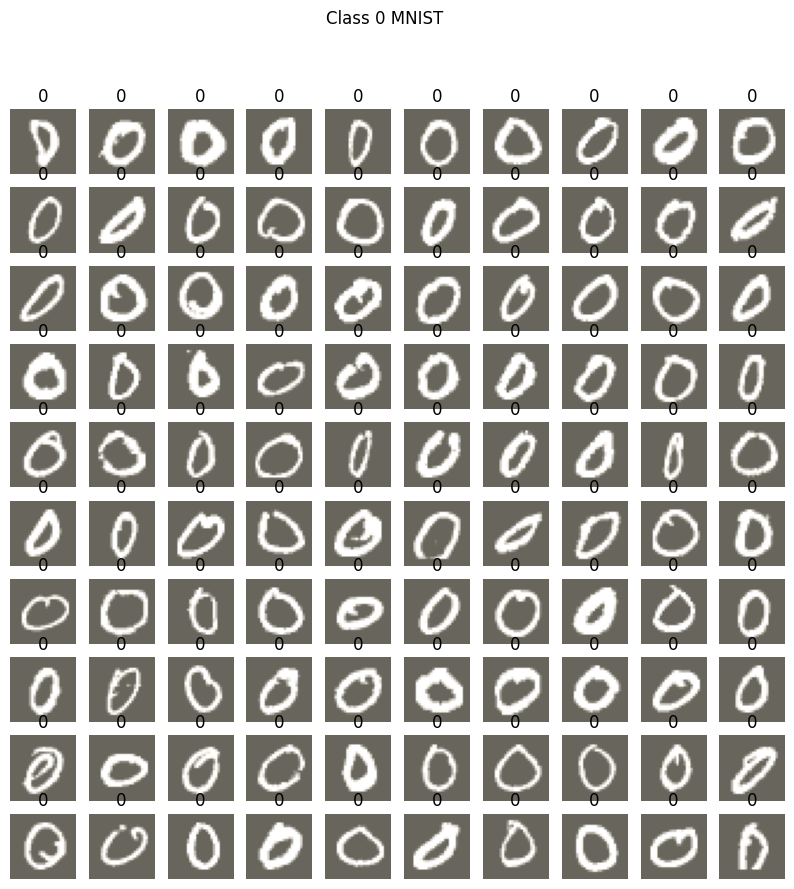

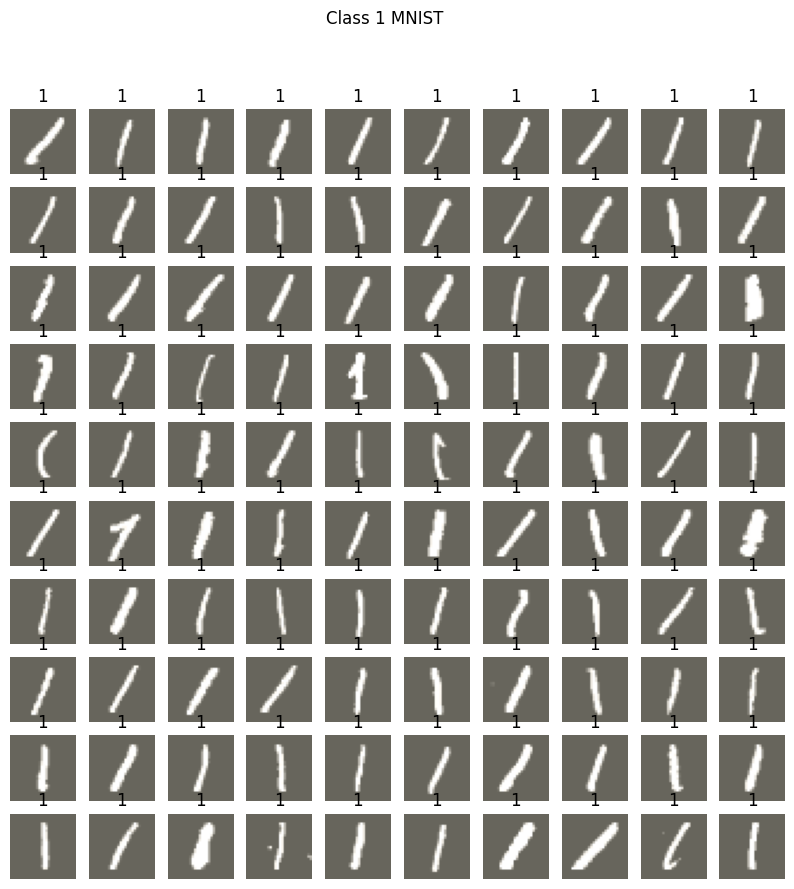

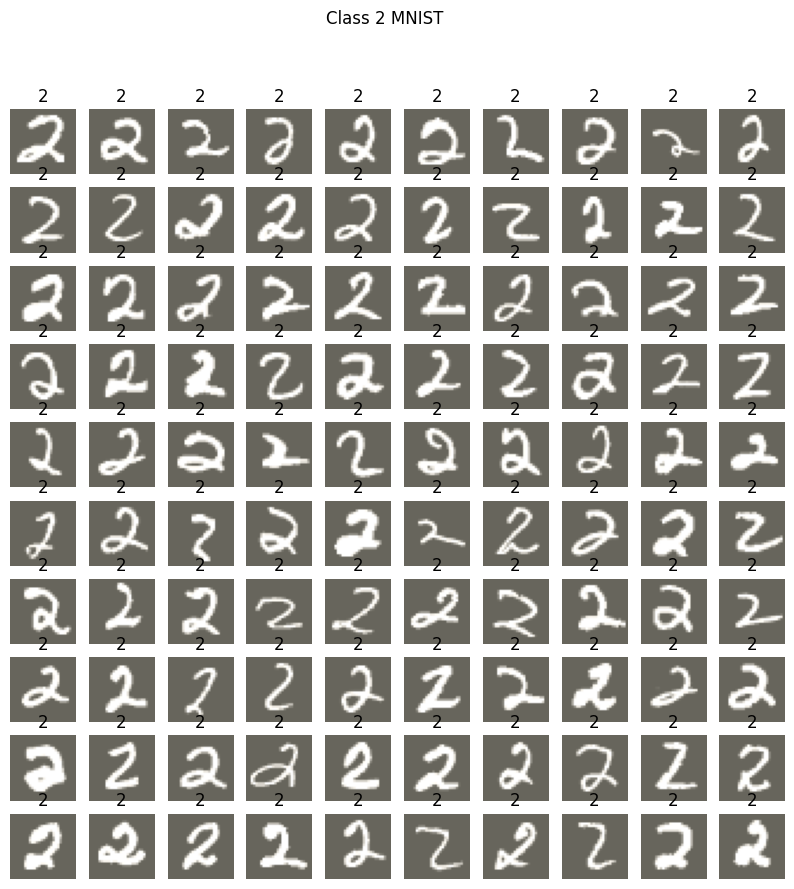

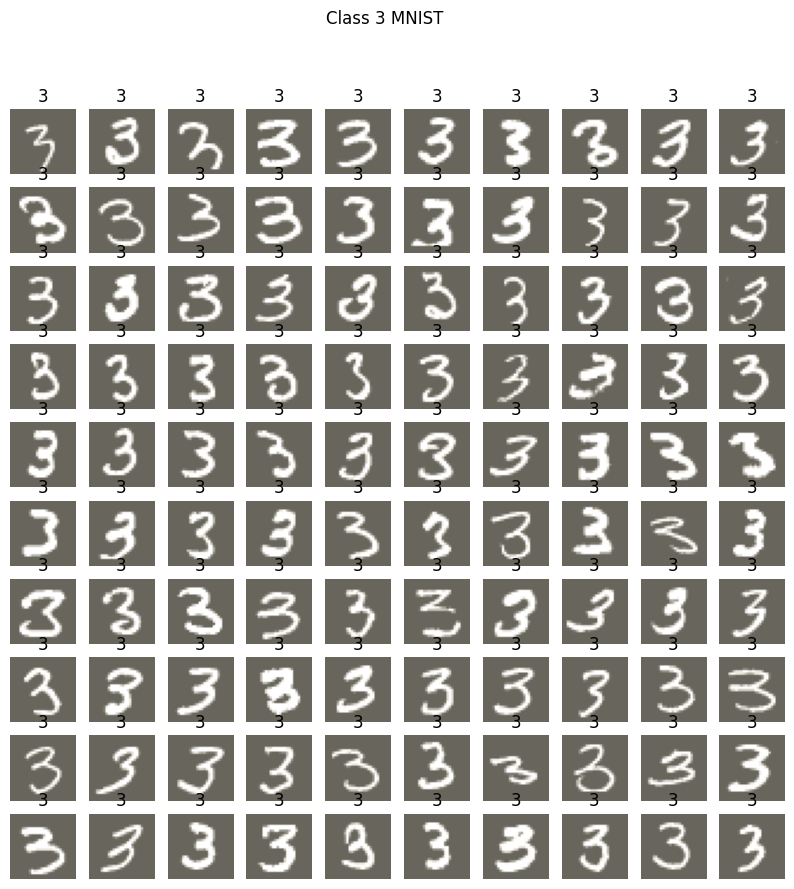

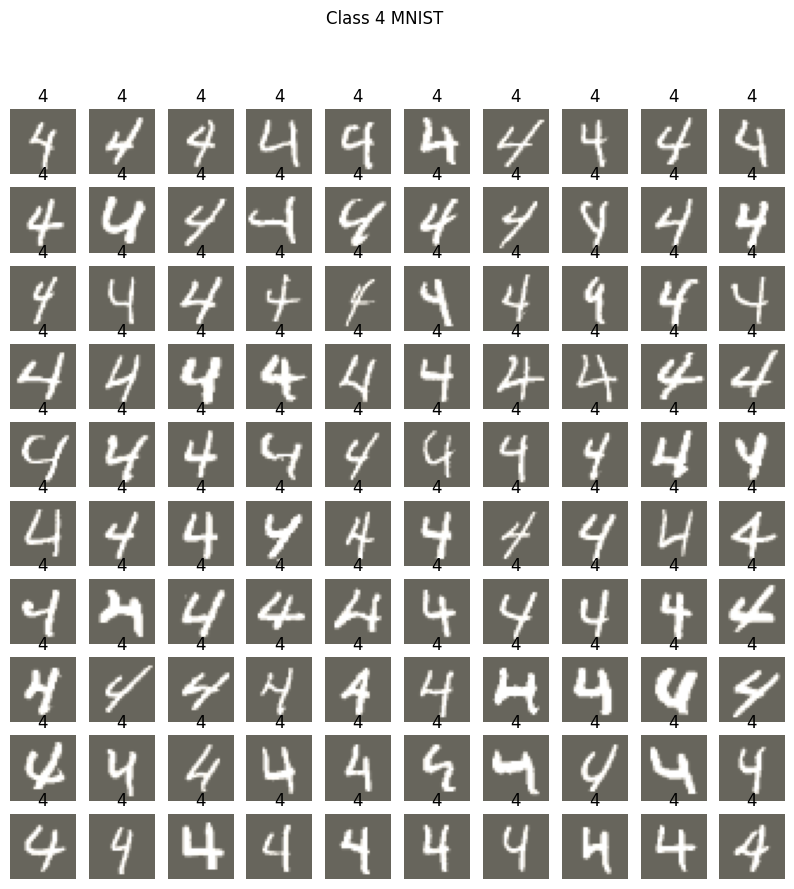

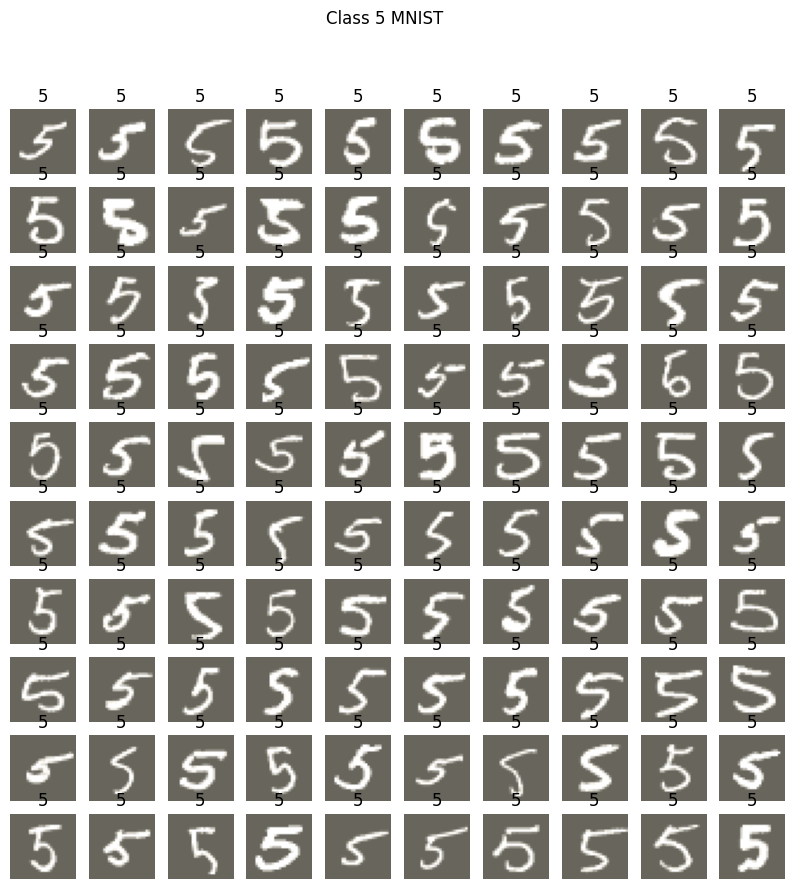

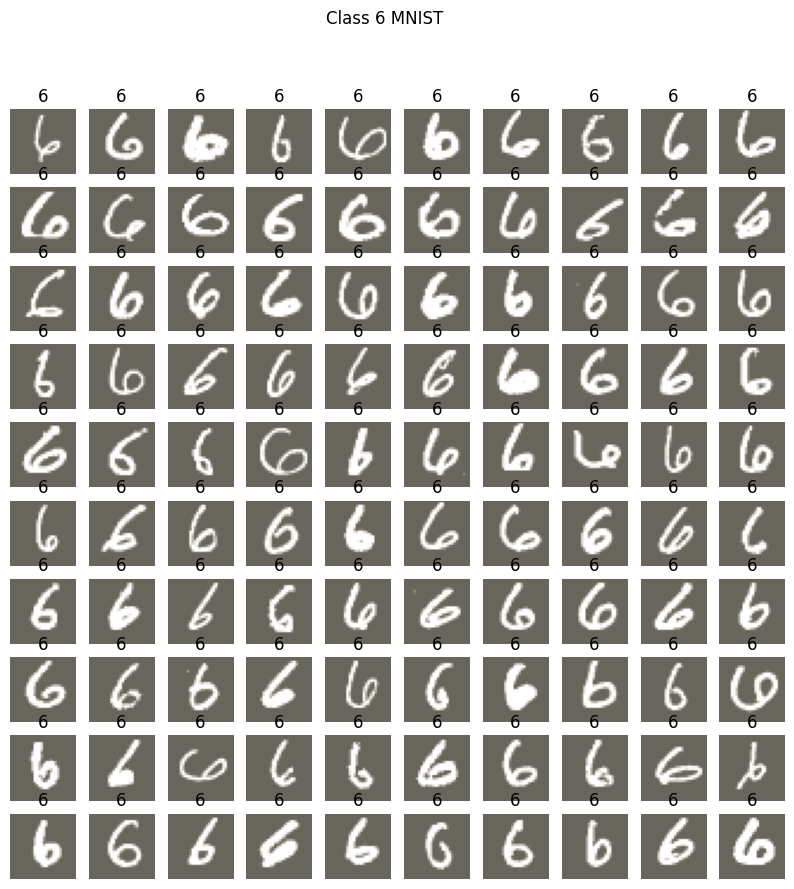

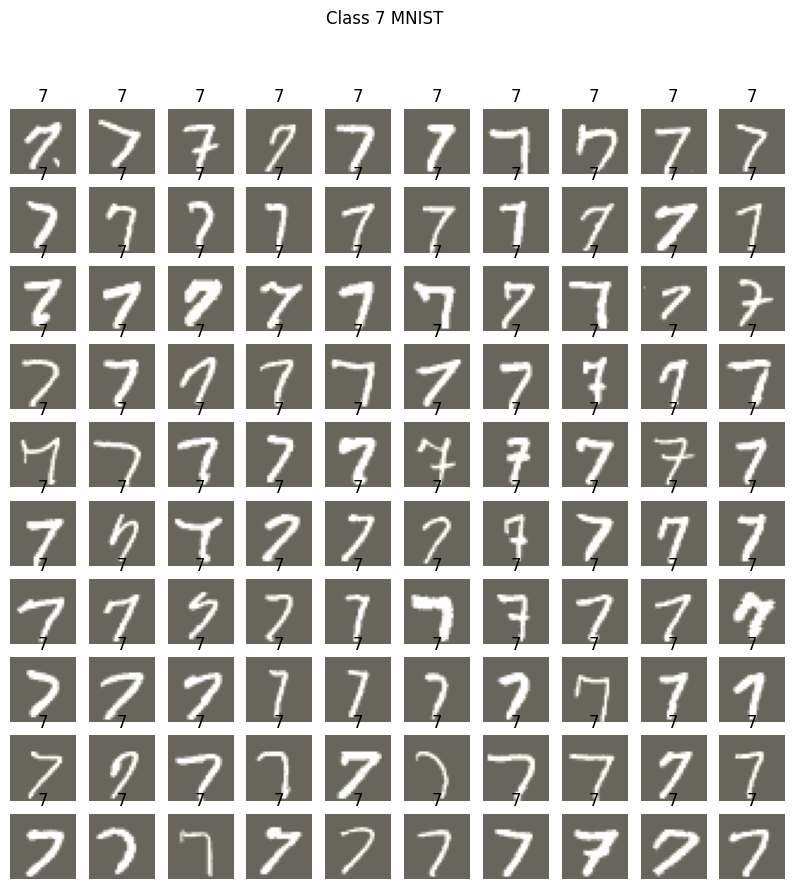

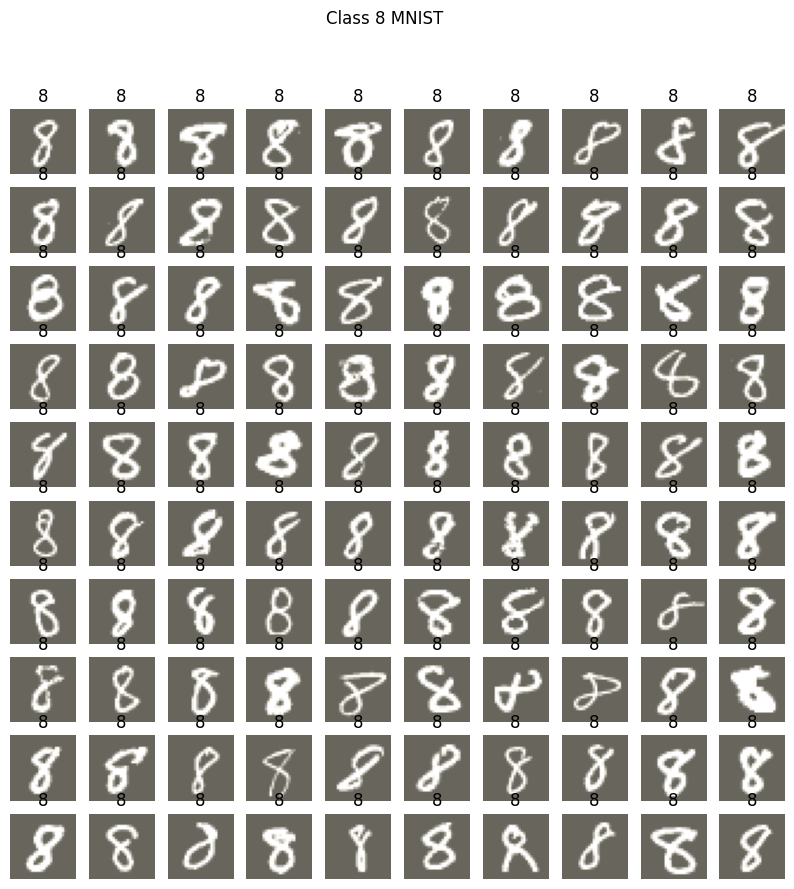

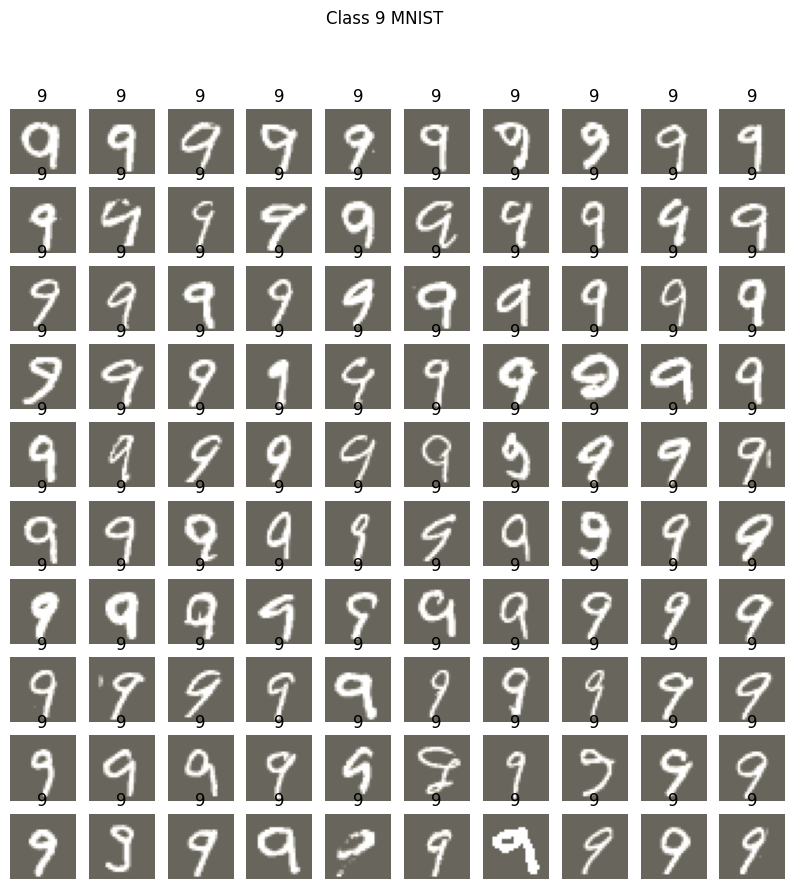

In [25]:
show_images(mnist_0_images, mnist_0_labels, "Class 0 MNIST")
show_images(mnist_1_images, mnist_1_labels, "Class 1 MNIST")
show_images(mnist_2_images, mnist_2_labels, "Class 2 MNIST")
show_images(mnist_3_images, mnist_3_labels, "Class 3 MNIST")
show_images(mnist_4_images, mnist_4_labels, "Class 4 MNIST")
show_images(mnist_5_images, mnist_5_labels, "Class 5 MNIST")
show_images(mnist_6_images, mnist_6_labels, "Class 6 MNIST")
show_images(mnist_7_images, mnist_7_labels, "Class 7 MNIST")
show_images(mnist_8_images, mnist_8_labels, "Class 8 MNIST")
show_images(mnist_9_images, mnist_9_labels, "Class 9 MNIST")

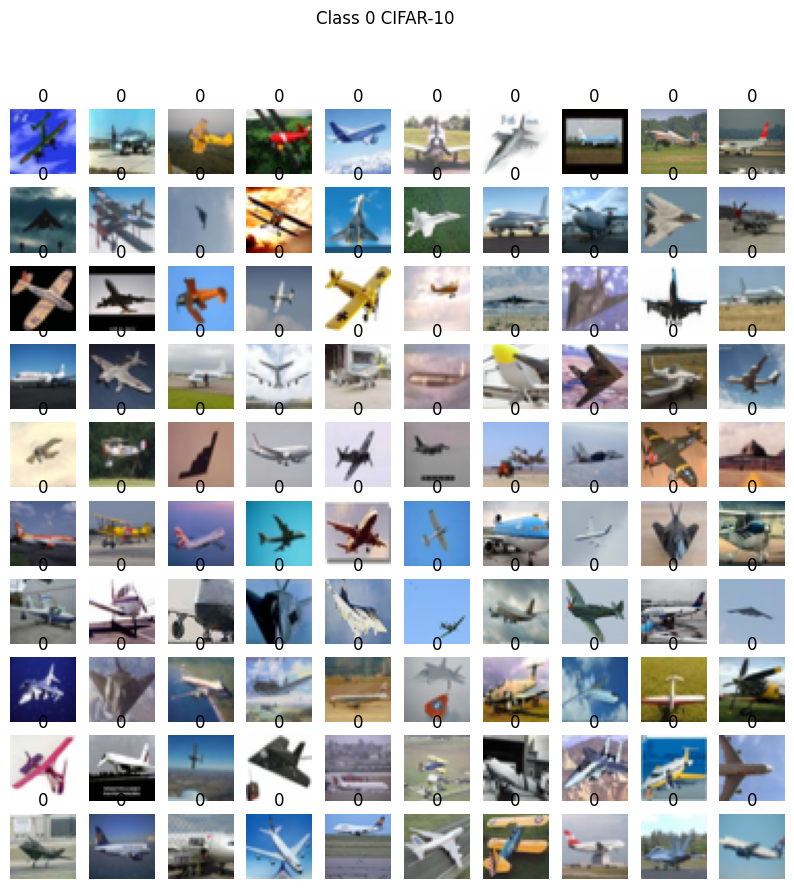

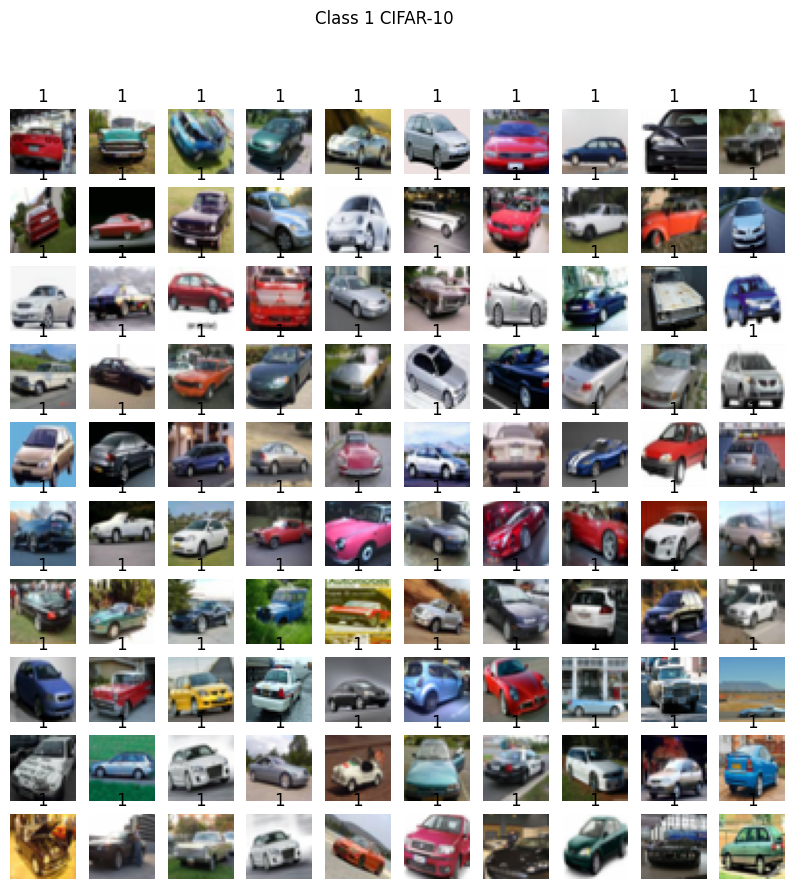

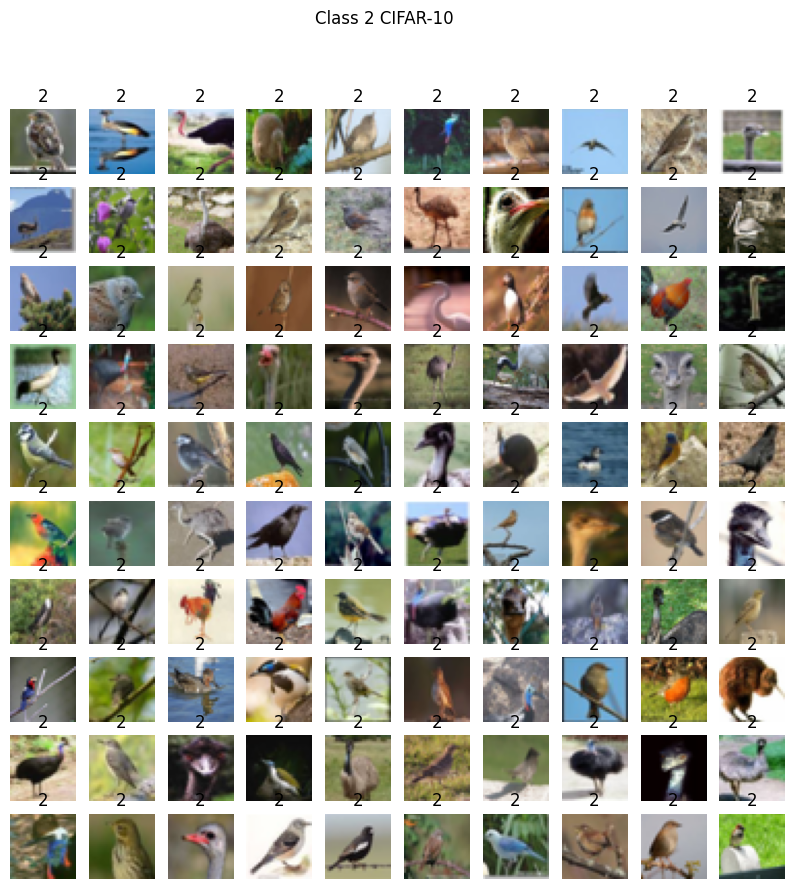

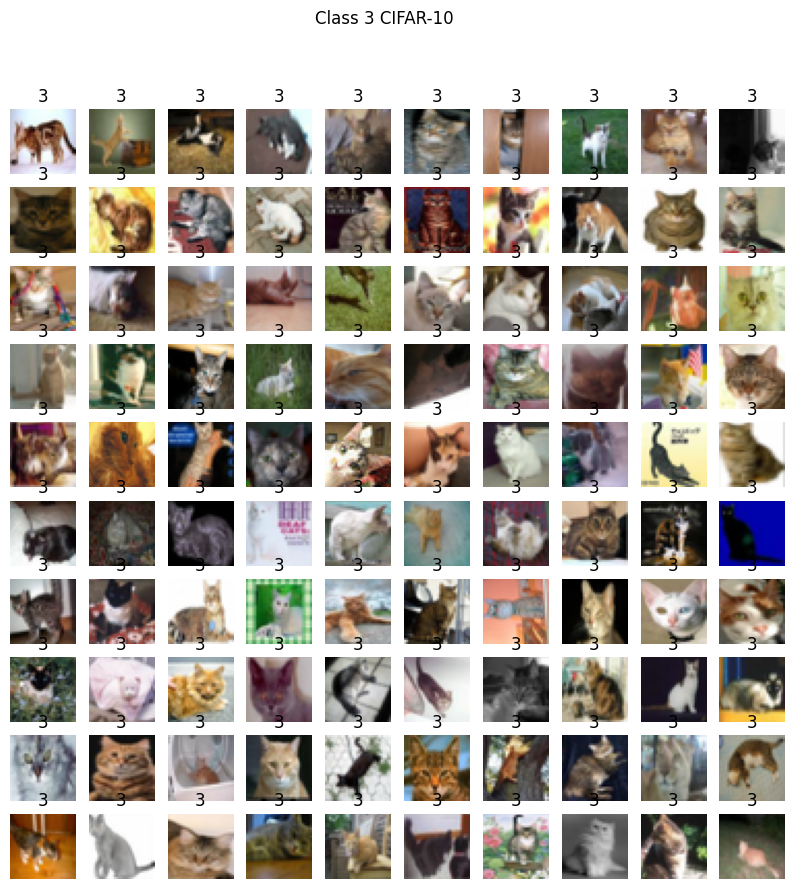

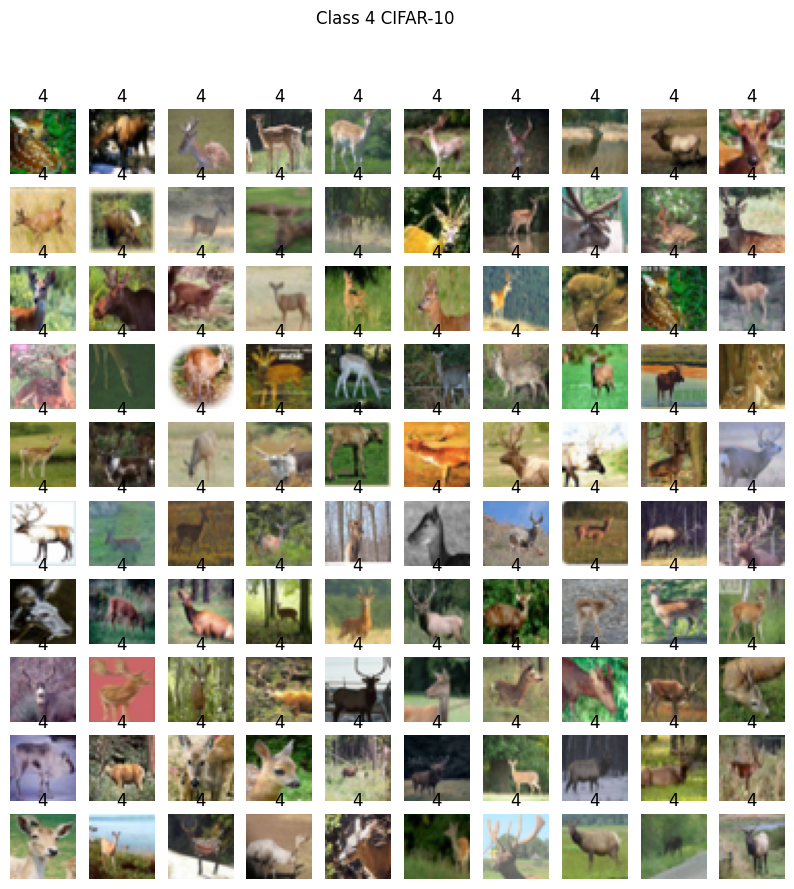

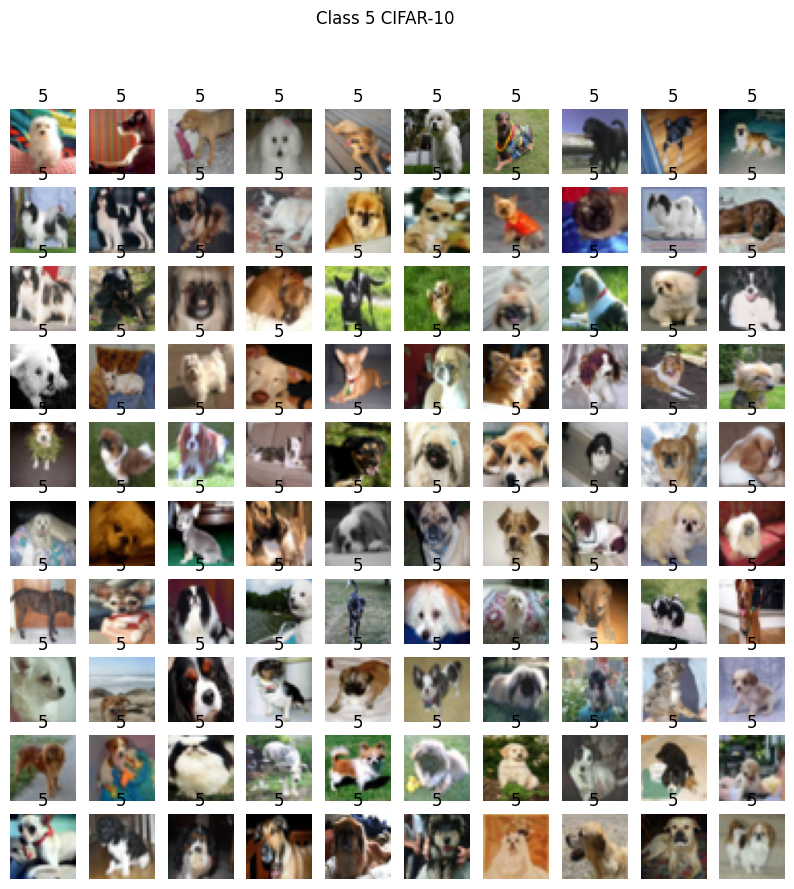

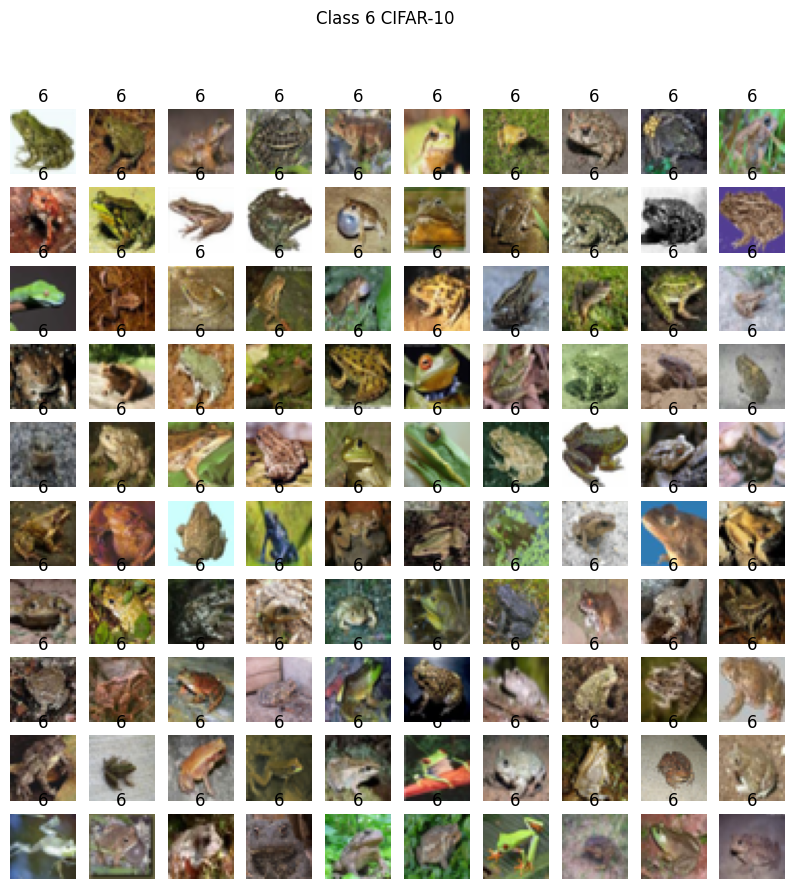

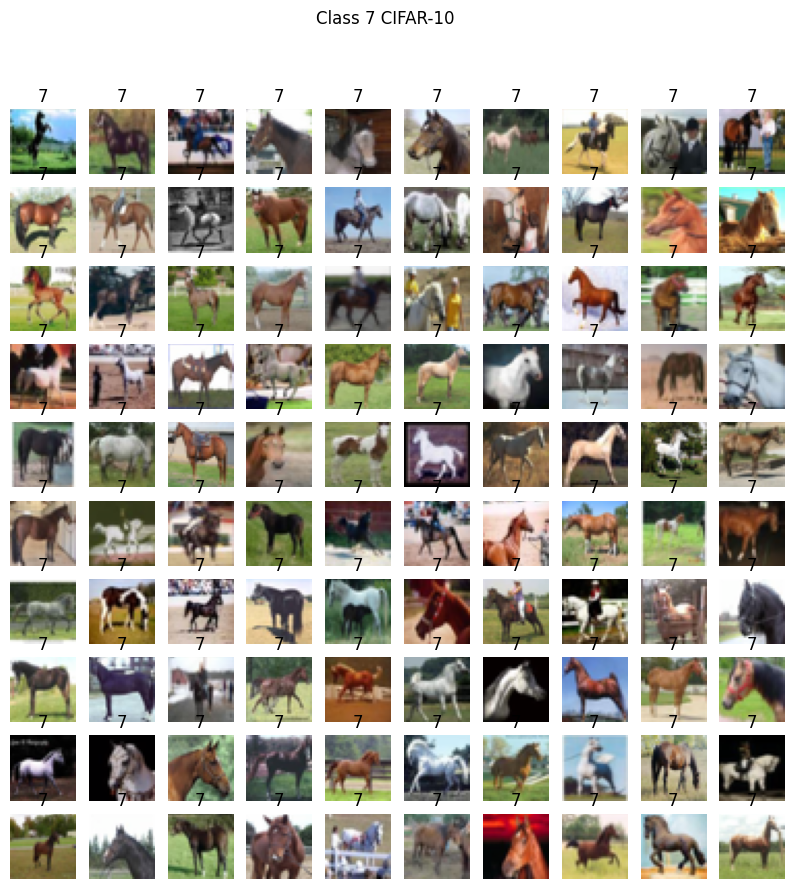

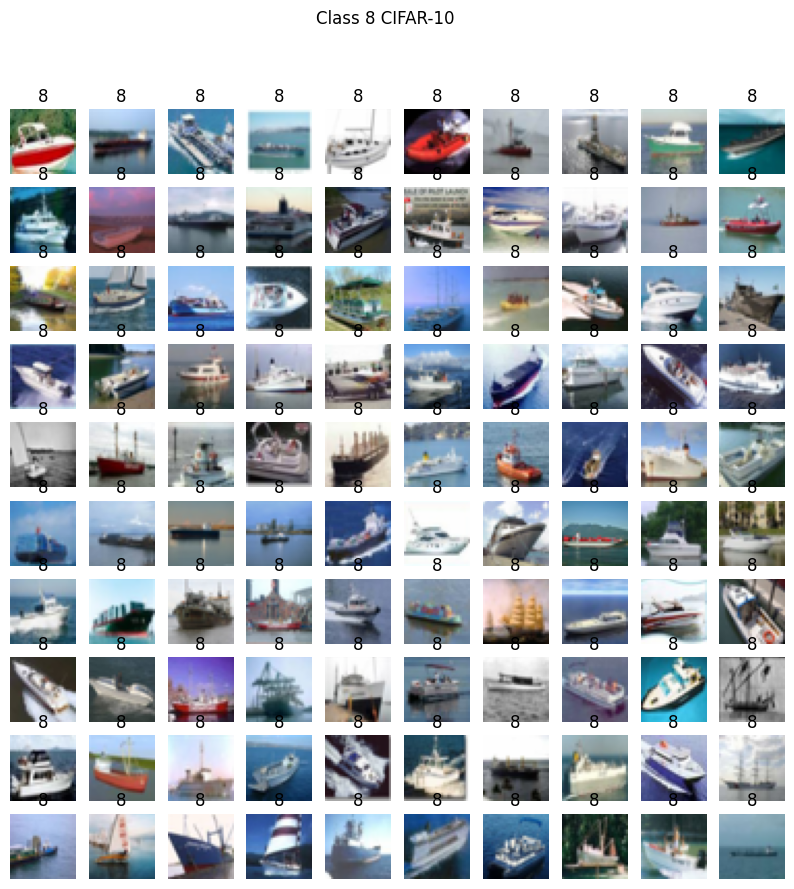

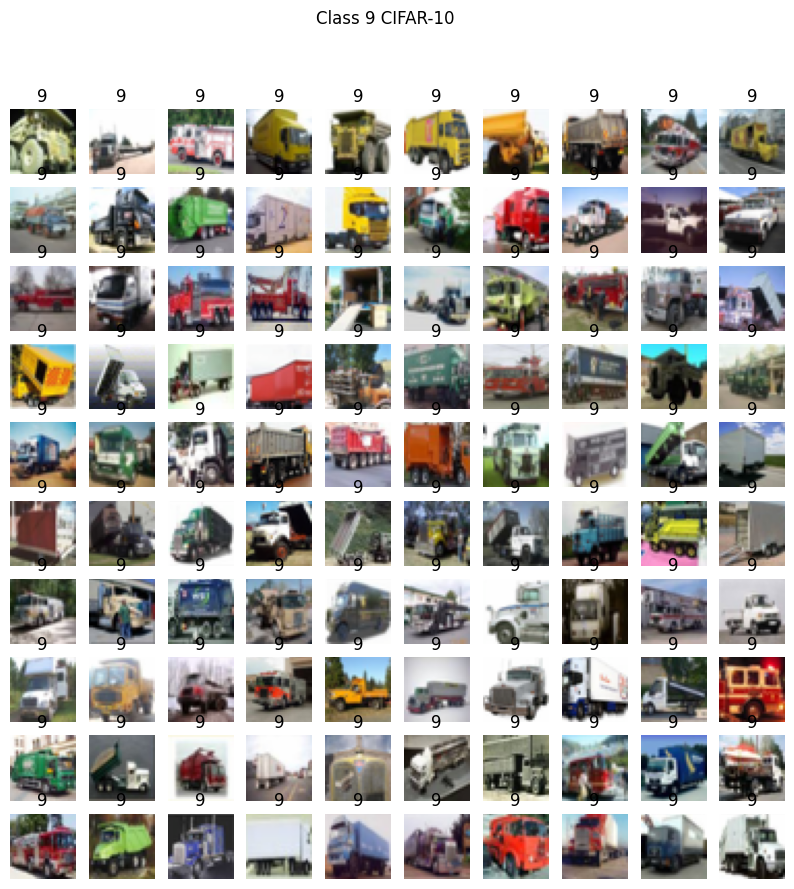

In [26]:
show_images(cifar_0_images, cifar_0_labels, "Class 0 CIFAR-10")
show_images(cifar_1_images, cifar_1_labels, "Class 1 CIFAR-10")
show_images(cifar_2_images, cifar_2_labels, "Class 2 CIFAR-10")
show_images(cifar_3_images, cifar_3_labels, "Class 3 CIFAR-10")
show_images(cifar_4_images, cifar_4_labels, "Class 4 CIFAR-10")
show_images(cifar_5_images, cifar_5_labels, "Class 5 CIFAR-10")
show_images(cifar_6_images, cifar_6_labels, "Class 6 CIFAR-10")
show_images(cifar_7_images, cifar_7_labels, "Class 7 CIFAR-10")
show_images(cifar_8_images, cifar_8_labels, "Class 8 CIFAR-10")
show_images(cifar_9_images, cifar_9_labels, "Class 9 CIFAR-10")


In [27]:
def calculate_accuracy_and_uncertainty(correct_count, incorrect_count, class_entropy, overall_entropy):
    """
    Calculate accuracy and uncertainty based on correct and incorrect counts
    and convert entropy to uncertainty.

    Args:
        correct_count (dict): Number of correct predictions per class.
        incorrect_count (dict): Number of incorrect predictions per class.
        class_entropy (dict): Entropy values per class.
        overall_entropy (float): Overall average entropy.

    Returns:
        dict: Accuracy per class.
        float: Overall accuracy.
        dict: Uncertainty (converted from entropy) per class.
        float: Overall uncertainty (converted from entropy).
    """
    class_accuracy = {}
    class_uncertainty = {}
    total_correct = 0
    total_samples = 0

    # Calculate accuracy and uncertainty for each class
    for cls in correct_count.keys():
        total_class_samples = correct_count[cls] + incorrect_count[cls]
        total_correct += correct_count[cls]
        total_samples += total_class_samples

        # Accuracy for the class
        if total_class_samples > 0:
            class_accuracy[cls] = correct_count[cls] / total_class_samples
        else:
            class_accuracy[cls] = 0.0

        # Uncertainty (directly using entropy as uncertainty)
        class_uncertainty[cls] = class_entropy[cls]

    # Overall accuracy
    if total_samples > 0:
        overall_accuracy = total_correct / total_samples
    else:
        overall_accuracy = 0.0

    # Overall uncertainty (same as overall_entropy)
    overall_uncertainty = overall_entropy

    return class_accuracy, overall_accuracy, class_uncertainty, overall_uncertainty


In [28]:
from sklearn.metrics import confusion_matrix
import numpy as np
import torch
import torch.nn.functional as F

def compute_uncertainty_and_class_analysis_with_uncertainty_decomposition(
    models,
    data_loader_list,  # List of data loaders, one per class
    device,
    num_samples=1000,
    use_dropout=False,
    use_ensemble=False
):
    correct_count = {}
    incorrect_count = {}
    class_entropy = {}
    collective_entropy = []
    aleatoric_uncertainty = {}
    epistemic_uncertainty = {}

    for class_idx, data_loader in enumerate(data_loader_list):
        class_predictions = []
        class_true_labels = []
        class_entropy_values = []

        # Multiple stochastic forward passes or ensemble predictions
        with torch.no_grad():
            if use_ensemble:
                for model in models:
                    model = model.to(device)
                    if use_dropout:
                        model.train()
                    else:
                        model.eval()
                    batch_predictions = []
                    for images, labels in data_loader:
                        images = images.to(device)
                        outputs = F.softmax(model(images), dim=-1)  # Apply softmax to logits
                        batch_predictions.append(outputs.cpu().numpy())
                        class_true_labels.extend(labels.numpy())
                    class_predictions.append(np.concatenate(batch_predictions, axis=0))
            else:
                model = models
                model = model.to(device)
                if use_dropout:
                    model.train()
                else:
                    model.eval()
                for _ in range(num_samples):
                    batch_predictions = []
                    for images, labels in data_loader:
                        images = images.to(device)
                        outputs = F.softmax(model(images), dim=-1)  # Apply softmax to logits
                        batch_predictions.append(outputs.cpu().numpy())
                        class_true_labels.extend(labels.numpy())
                    class_predictions.append(np.concatenate(batch_predictions, axis=0))

        # Stack predictions to compute mean, variance, and entropy
        class_predictions = np.stack(class_predictions, axis=0)  # Shape: (num_samples or num_models, num_images, num_classes)
        mean_prediction = np.mean(class_predictions, axis=0)
        variance_prediction = np.var(class_predictions, axis=0)

        # Clip mean_prediction to avoid log(0) or log of negative values
        mean_prediction = np.clip(mean_prediction, 1e-10, 1.0)

        # Total predictive entropy
        total_entropy = -np.sum(mean_prediction * np.log(mean_prediction), axis=-1)
        class_entropy_values.extend(total_entropy)
        collective_entropy.extend(total_entropy)

        # Aleatoric uncertainty
        aleatoric_unc = np.mean(
            [-np.sum(pred * np.log(np.clip(pred, 1e-10, 1.0)), axis=-1) for pred in class_predictions],
            axis=0,
        )

        # Epistemic uncertainty
        epistemic_unc = total_entropy - aleatoric_unc

        # Compute predicted classes
        predicted_classes = np.argmax(mean_prediction, axis=-1)

        # Initialize counters for this class
        correct_count[class_idx] = 0
        incorrect_count[class_idx] = 0

        # Analyze class-specific correctness
        for true_label, predicted_label, ent in zip(class_true_labels, predicted_classes, total_entropy):
            if true_label == class_idx:
                if true_label == predicted_label:
                    correct_count[class_idx] += 1
                else:
                    incorrect_count[class_idx] += 1

        # Store uncertainties for this class
        class_entropy[class_idx] = np.mean(class_entropy_values)
        aleatoric_uncertainty[class_idx] = np.mean(aleatoric_unc)
        epistemic_uncertainty[class_idx] = np.mean(epistemic_unc)

    # Compute collective average uncertainties across all classes
    overall_entropy = np.mean(collective_entropy)
    overall_aleatoric = np.mean(list(aleatoric_uncertainty.values()))
    overall_epistemic = np.mean(list(epistemic_uncertainty.values()))

    return correct_count, incorrect_count, class_entropy, overall_entropy, aleatoric_uncertainty, overall_aleatoric, epistemic_uncertainty, overall_epistemic


In [153]:
std_model = CNN_MODEL_MNIST_STD
loop_model = CNN_MODEL_MNIST_loop
methode_name = "CNN Standard"
data_set_name = "MNIST"
loop_list = MNIST_LOOP_LIST
num_samples = 1000

ensmalbe_tog = False
drop_tog = False

results_std = compute_uncertainty_and_class_analysis_with_uncertainty_decomposition(
    models=std_model,
    data_loader_list=loop_list,
    device=torch.device("cuda" if torch.cuda.is_available() else "cpu"),
    num_samples=num_samples,
    use_dropout=drop_tog,
    use_ensemble=ensmalbe_tog
)

results_loop = compute_uncertainty_and_class_analysis_with_uncertainty_decomposition(
    models=loop_model,
    data_loader_list=loop_list,
    device=torch.device("cuda" if torch.cuda.is_available() else "cpu"),
    num_samples=num_samples,
    use_dropout=drop_tog,
    use_ensemble=ensmalbe_tog
)

(correct_count_std, incorrect_count_std, class_entropy_std, overall_entropy_std,
 aleatoric_uncertainty_std, overall_aleatoric_std, epistemic_uncertainty_std, overall_epistemic_std) = results_std

(correct_count_loop, incorrect_count_loop, class_entropy_loop, overall_entropy_loop,
 aleatoric_uncertainty_loop, overall_aleatoric_loop, epistemic_uncertainty_loop, overall_epistemic_loop) = results_loop

# Print results
print("Correct Counts by Class:", correct_count_std)
print("Incorrect Counts by Class:", incorrect_count_std)
print("Average Total Entropy by Class:", class_entropy_std)
print("Overall Average Total Entropy:", overall_entropy_std)
print("Average Aleatoric Uncertainty by Class:", aleatoric_uncertainty_std)
print("Overall Average Aleatoric Uncertainty:", overall_aleatoric_std)
print("Average Epistemic Uncertainty by Class:", epistemic_uncertainty_std)
print("Overall Average Epistemic Uncertainty:", overall_epistemic_std)

print("Correct Counts by Class:", correct_count_loop)
print("Incorrect Counts by Class:", incorrect_count_loop)
print("Average Total Entropy by Class:", class_entropy_loop)
print("Overall Average Total Entropy:", overall_entropy_loop)
print("Average Aleatoric Uncertainty by Class:", aleatoric_uncertainty_loop)
print("Overall Average Aleatoric Uncertainty:", overall_aleatoric_loop)
print("Average Epistemic Uncertainty by Class:", epistemic_uncertainty_loop)
print("Overall Average Epistemic Uncertainty:", overall_epistemic_loop)

Correct Counts by Class: {0: 100, 1: 99, 2: 100, 3: 100, 4: 100, 5: 100, 6: 100, 7: 100, 8: 100, 9: 100}
Incorrect Counts by Class: {0: 0, 1: 1, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0}
Average Total Entropy by Class: {0: 0.009065955, 1: 0.012726094, 2: 0.007166186, 3: 0.002507894, 4: 0.010605467, 5: 0.0026079107, 6: 0.0050982754, 7: 0.0037575546, 8: 0.008841429, 9: 0.0070066736}
Overall Average Total Entropy: 0.0069383434
Average Aleatoric Uncertainty by Class: {0: 0.009066887, 1: 0.012727001, 2: 0.0071665733, 3: 0.0025091157, 4: 0.010606238, 5: 0.0026080643, 6: 0.0050981916, 7: 0.0037579597, 8: 0.008842274, 9: 0.007007695}
Overall Average Aleatoric Uncertainty: 0.006939
Average Epistemic Uncertainty by Class: {0: -9.322016e-07, 1: -9.082849e-07, 2: -3.864438e-07, 3: -1.2217324e-06, 4: -7.7036805e-07, 5: -1.5431871e-07, 6: 8.365335e-08, 7: -4.0502883e-07, 8: -8.4541773e-07, 9: -1.0209321e-06}
Overall Average Epistemic Uncertainty: -6.561075e-07
Correct Counts by Class: {0: 98, 

In [154]:
class_accuracy_std, overall_accuracy_std, class_uncertainty_std, overall_uncertainty_std = calculate_accuracy_and_uncertainty(
    correct_count_std,
    incorrect_count_std,
    class_entropy_std,
    overall_entropy_std
)

class_accuracy_loop, overall_accuracy_loop, class_uncertainty_loop, overall_uncertainty_loop = calculate_accuracy_and_uncertainty(
    correct_count_loop,
    incorrect_count_loop,
    class_entropy_loop,
    overall_entropy_loop
)
class_accuracy_std_percentage = {cls: acc * 100 for cls, acc in class_accuracy_std.items()}
overall_accuracy_std_percentage = overall_accuracy_std * 100

class_accuracy_loop_percentage = {cls: acc * 100 for cls, acc in class_accuracy_loop.items()}
overall_accuracy_loop_percentage = overall_accuracy_loop * 100

# Convert class uncertainty and overall uncertainty to percentages (if applicable)
class_uncertainty_std_percentage = {cls: unc * 100 for cls, unc in class_uncertainty_std.items()}
overall_uncertainty_std_percentage = overall_uncertainty_std * 100

class_uncertainty_loop_percentage = {cls: unc * 100 for cls, unc in class_uncertainty_loop.items()}
overall_uncertainty_loop_percentage = overall_uncertainty_loop * 100

# Print results in percentage form
print("Class Accuracy (Standard Model, %):", class_accuracy_std_percentage)
print("Overall Accuracy (Standard Model, %):", overall_accuracy_std_percentage)
print("Class Uncertainty (Standard Model, %):", class_uncertainty_std_percentage)
print("Overall Uncertainty (Standard Model, %):", overall_uncertainty_std_percentage)

print("Class Accuracy (Loop-Sided Model, %):", class_accuracy_loop_percentage)
print("Overall Accuracy (Loop-Sided Model, %):", overall_accuracy_loop_percentage)
print("Class Uncertainty (Loop-Sided Model, %):", class_uncertainty_loop_percentage)
print("Overall Uncertainty (Loop-Sided Model, %):", overall_uncertainty_loop_percentage)

Class Accuracy (Standard Model, %): {0: 100.0, 1: 99.0, 2: 100.0, 3: 100.0, 4: 100.0, 5: 100.0, 6: 100.0, 7: 100.0, 8: 100.0, 9: 100.0}
Overall Accuracy (Standard Model, %): 99.9
Class Uncertainty (Standard Model, %): {0: 0.9065954945981503, 1: 1.2726093642413616, 2: 0.7166185881942511, 3: 0.250789406709373, 4: 1.0605466552078724, 5: 0.26079106610268354, 6: 0.5098275374621153, 7: 0.37575545720756054, 8: 0.8841428905725479, 9: 0.7006673607975245}
Overall Uncertainty (Standard Model, %): 0.6938343401998281
Class Accuracy (Loop-Sided Model, %): {0: 98.0, 1: 82.0, 2: 100.0, 3: 100.0, 4: 100.0, 5: 94.0, 6: 99.0, 7: 94.0, 8: 99.0, 9: 94.0}
Overall Accuracy (Loop-Sided Model, %): 96.0
Class Uncertainty (Loop-Sided Model, %): {0: 1.2638041749596596, 1: 20.610757172107697, 2: 2.606425993144512, 3: 1.2990704737603664, 4: 1.2347177602350712, 5: 4.968134313821793, 6: 1.6874022781848907, 7: 8.03423821926117, 8: 0.37899233866482973, 9: 4.9316104501485825}
Overall Uncertainty (Loop-Sided Model, %): 4

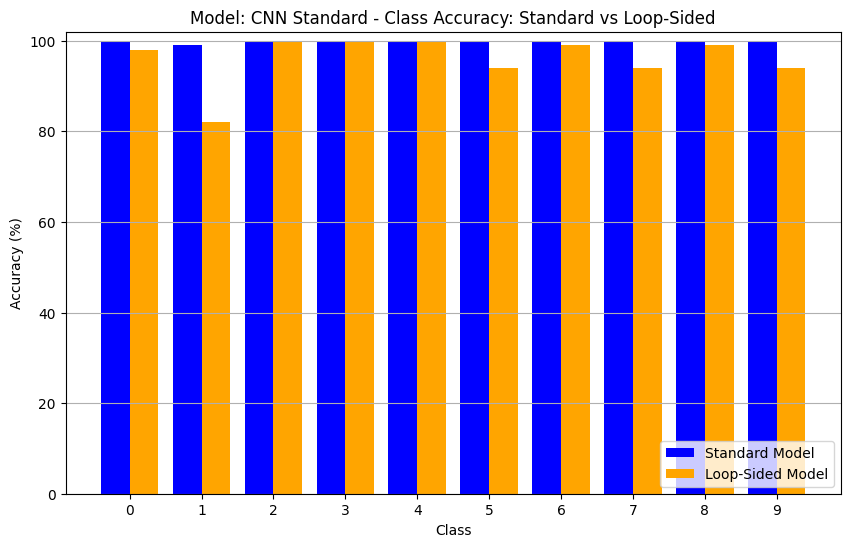

In [156]:
import matplotlib.pyplot as plt
import numpy as np

# Data for accuracy
classes = list(class_accuracy_std.keys())
std_accuracy = list(class_accuracy_std.values())
loop_accuracy = list(class_accuracy_loop.values())

x = np.arange(len(classes))  # Class indices

# Convert accuracy to percentages
std_accuracy_percentage = [acc * 100 for acc in std_accuracy]
loop_accuracy_percentage = [acc * 100 for acc in loop_accuracy]

plt.figure(figsize=(10, 6))
plt.bar(x - 0.2, std_accuracy_percentage, width=0.4, label='Standard Model', color='blue')
plt.bar(x + 0.2, loop_accuracy_percentage, width=0.4, label='Loop-Sided Model', color='orange')
plt.xticks(x, classes)
plt.xlabel("Class")
plt.ylabel("Accuracy (%)")  # Updated ylabel to indicate percentage
plt.title(f"Model: {methode_name} - Class Accuracy: Standard vs Loop-Sided")
plt.legend(loc='lower right')  # Move legend to the bottom-right corner
plt.grid(axis='y')

# Adjust y-axis limits to show percentage clearly
plt.ylim(0, 102)
text_stuff = f"{methode_name}_{data_set_name}_accuracy.png"
plt.savefig(r"images_report\test_loop\\" + text_stuff)
plt.show()


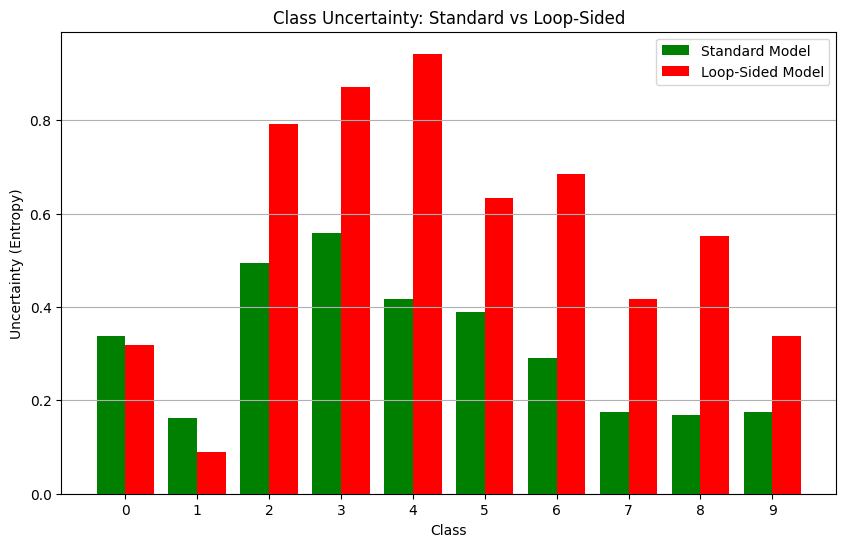

In [92]:
# Data for uncertainty
std_uncertainty = list(class_uncertainty_std.values())
loop_uncertainty = list(class_uncertainty_loop.values())

plt.figure(figsize=(10, 6))
plt.bar(x - 0.2, std_uncertainty, width=0.4, label='Standard Model', color='green')
plt.bar(x + 0.2, loop_uncertainty, width=0.4, label='Loop-Sided Model', color='red')
plt.xticks(x, classes)
plt.xlabel("Class")
plt.ylabel("Uncertainty (Entropy)")
plt.title("Class Uncertainty: Standard vs Loop-Sided")
plt.legend()
plt.grid(axis='y')
plt.show()


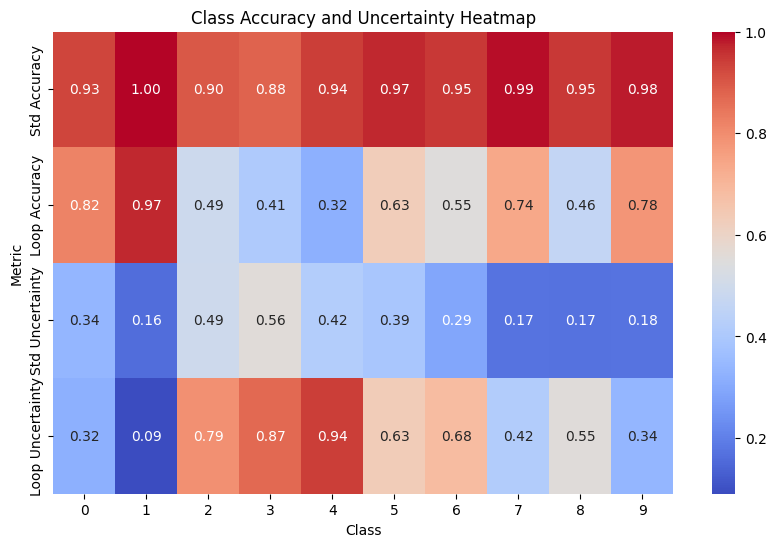

In [94]:
import seaborn as sns
import pandas as pd

# Create a DataFrame for heatmap
heatmap_data = pd.DataFrame({
    "Class": classes,
    "Std Accuracy": std_accuracy,
    "Loop Accuracy": loop_accuracy,
    "Std Uncertainty": std_uncertainty,
    "Loop Uncertainty": loop_uncertainty
}).set_index("Class")

plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data.T, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Class Accuracy and Uncertainty Heatmap")
plt.xlabel("Class")
plt.ylabel("Metric")
plt.show()
